### Ablation study: Loss $\mathcal L_\mathrm{geo}$, dataset $\mathcal S|_{b = 3}$

In [1]:
CHOSEN_ARRAY_B = 3

In [2]:
import multiprocessing as mp
import numpy as np

In [3]:
def objective_process(result_queue):
    import matplotlib.pyplot as plt
    import tensorflow as tf
    import numpy as np
    
    import DissimilarityMetrics
    import ChannelChartingCore
    import Evaluation

    import dichasus_cf0x

    print("Loading Dataset...")
    groundtruth_positions = []
    csi_time_domain_onearray = []
    timestamps = []
    
    for csi, pos, time in dichasus_cf0x.singlearray_trainingsets[CHOSEN_ARRAY_B-1].batch(1000):
        csi_time_domain_onearray.append(csi.numpy())
        groundtruth_positions.append(pos.numpy())
        timestamps.append(time.numpy())
    
    csi_time_domain_onearray = np.concatenate(csi_time_domain_onearray)
    groundtruth_positions = np.concatenate(groundtruth_positions)
    timestamps = np.concatenate(timestamps)
    
    MEASUREMENT_INTERVAL = 0.048
    timestamps = timestamps - timestamps[0]
    timestamps = np.round(timestamps / MEASUREMENT_INTERVAL) * MEASUREMENT_INTERVAL    
    
    Evaluation.plot_colorized(groundtruth_positions, groundtruth_positions, title="Ground Truth Positions")
    
    @tf.function
    def compute_adp_dissimilarity_matrix(csi_array):
        output = tf.TensorArray(tf.float32, size = csi_array.shape[0])
    
        powers = tf.einsum("lbrmt,lbrmt->lbt", csi_array, tf.math.conj(csi_array))
        for i in tf.range(csi_array.shape[0]):
            w = csi_array[i:,:,:,:]
            h = csi_array[i,:,:,:]
    
            dotproducts = tf.abs(tf.square(tf.einsum("brmt,lbrmt->lbt", tf.math.conj(h), w)))
            d_new = tf.math.reduce_sum(1 - dotproducts / tf.math.real(powers[i] * powers[i:]), axis = (1, 2))
            d = tf.concat([tf.zeros(i), tf.maximum(d_new, 0)], 0)
    
            output = output.write(i, d)

        dissim_upper_tri = output.stack()
        return dissim_upper_tri + tf.transpose(dissim_upper_tri)
    
    adp_dissimilarity_matrix = compute_adp_dissimilarity_matrix(csi_time_domain_onearray).numpy()
    
    # Ablation study: Edge weights are now deterministic, based on existing code from [dissimilarity-metric based Channel Charting tutorial](https://dichasus.inue.uni-stuttgart.de/tutorials/tutorial/dissimilarity-metric-channelcharting/).
    
    # Compute timestamp-based dissimilarity matrix
    timestamp_dissimilarity_matrix = np.abs(np.subtract.outer(timestamps, timestamps))
    
    TIME_THRESHOLD = 2
    small_time_dissimilarity_indices = np.logical_and(timestamp_dissimilarity_matrix < TIME_THRESHOLD, timestamp_dissimilarity_matrix > 0)
    small_time_dissimilarities = timestamp_dissimilarity_matrix[small_time_dissimilarity_indices]
    small_adp_dissimilarities = adp_dissimilarity_matrix[small_time_dissimilarity_indices]
    
    n_bins = 1500
    
    fig, ax1 = plt.subplots()
    occurences, edges, patches = ax1.hist(small_adp_dissimilarities / small_time_dissimilarities, range = (0, 50), bins = n_bins)
    ax1.set_xlabel("$D_\mathrm{APDP} / D_\mathrm{time}$")
    ax1.set_ylabel("Number of Occurences")
    
    bin_centers = edges[:-1] + np.diff(edges) / 2.
    max_bin = np.argmax(occurences)
    threshold_bin = np.argmin(occurences[:max_bin])
    scaling_factor = bin_centers[threshold_bin]
    min_threshold = occurences[threshold_bin]
    
    plt.bar(bin_centers[:max_bin], occurences[:max_bin], width = edges[1] - edges[0])
    plt.axhline(y = min_threshold, color = 'r', linestyle = '-')
    plt.text(4, min_threshold + 10, "Mode Separation Threshold", color = 'r',)
    plt.axvline(x = scaling_factor, color = 'r', linestyle = '-')
    plt.xlabel("$D_\mathrm{APDP} / D_\mathrm{time}$")
    plt.ylabel("Number of Occurences")
    plt.show()
    
    print("gamma = ", scaling_factor)
    
    # Fuse ADP-based and time-based dissimilarity matrices
    dissimilarity_matrix_fused = np.minimum(adp_dissimilarity_matrix, timestamp_dissimilarity_matrix * scaling_factor)
    
    class DeterministicDissimilarityMetric(DissimilarityMetrics.GaussianDissimilarityMetric):
        def __init__(self, dissimilarity_matrix, beta):
            self.dissimilarity_matrix = dissimilarity_matrix
            self.beta = beta
        
        def get_realization(self, output_matrix, variance_scale):
            output_matrix[:] = self.dissimilarity_matrix
    
        def mean_variance_along_path(self, paths, mask):
            dissimilarities = self.dissimilarity_matrix[paths[:,:-1], paths[:,1:]]
            dissimilarities_sum = np.sum(np.where(mask, dissimilarities, 0), axis = 1)
    
            return dissimilarities_sum, (dissimilarities_sum + self.beta) / 2
        
        def get_datapoint_count(self):
            return self.dissimilarity_matrix.shape[0]
    
        def is_contractable(self):
            return False
    
    beta = np.quantile(dissimilarity_matrix_fused, 0.01)
    dissimilarity_metric = DeterministicDissimilarityMetric(dissimilarity_matrix_fused, beta)
    
    GDM = ChannelChartingCore.GaussianDissimilarityModel([dissimilarity_metric])
    GDM.generate_short_paths(total_path_count = 40000, realization_count = 1)
    
    MIN_BATCH_SIZE = 500
    MAX_BATCH_SIZE = 4000
    LEARNING_RATE_INITIAL = 1.5e-2
    LEARNING_RATE_FINAL = 1e-2
    MAX_HOPLENGTH = 1500.0
    MIN_HOPLENGTH = 7.0
    MAX_PATHHOPS = 50
    TRAINING_BATCHES = 3000
    
    # Ablation Study: Disable acceleration constraint by setting `ACCELERATION_WEIGHT = 0`
    ACCELERATION_MEAN = 0.0
    ACCELERATION_VARIANCE = 0.85
    ACCELERATION_WEIGHT = 0 #1e-4
    
    plot_callback = None # Evaluation.PlotChartCallback(groundtruth_positions, csi_time_domain_onearray.shape[0], max_hops = MAX_PATHHOPS)
    cc = ChannelChartingCore.ChannelChart(GDM, csi_time_domain_onearray, timestamps, min_batch_size = MIN_BATCH_SIZE, max_batch_size = MAX_BATCH_SIZE, learning_rate_initial = LEARNING_RATE_INITIAL, learning_rate_final = LEARNING_RATE_FINAL, max_hoplength = MAX_HOPLENGTH, min_hoplength = MIN_HOPLENGTH, randomize_pathhops = False, training_batches = TRAINING_BATCHES, plot_callback = plot_callback, acceleration_mean = ACCELERATION_MEAN, acceleration_variance = ACCELERATION_VARIANCE, acceleration_weight = ACCELERATION_WEIGHT, max_pathhops = MAX_PATHHOPS)
    
    channel_chart_positions = cc.predict(csi_time_domain_onearray)
    ct, tw, ks = Evaluation.ct_tw_ks_on_subset(groundtruth_positions, channel_chart_positions)
    print(f"CT: {ct:.4f}\nTW: {tw:.4f}\nKS: {ks:.4f}")
    
    channel_chart_positions_transformed, errorvectors, errors, mae, cep = Evaluation.mean_absolute_error_transformed(groundtruth_positions, channel_chart_positions)
    Evaluation.plot_colorized(channel_chart_positions_transformed, groundtruth_positions, title = "CC After Affine Transform")

    drms = np.sqrt(np.mean(np.square(errors)))
    print(f"MAE: {mae:.4f}\nCEP: {cep:.4f}\nDRMS: {drms:.4f}")
    loss = cc.history.history["loss"][-1]
    print(f"Loss: {loss:.4f}")
    
    result_queue.put((mae, cep, drms, loss))

In [4]:
maes = []
ceps = []
drmss = []
losses = []

result_queue = mp.Queue()

2024-12-05 12:07:02.189920: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:07:03.005522: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:07:04.333674: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:07:04.387746: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:07:28.371649: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


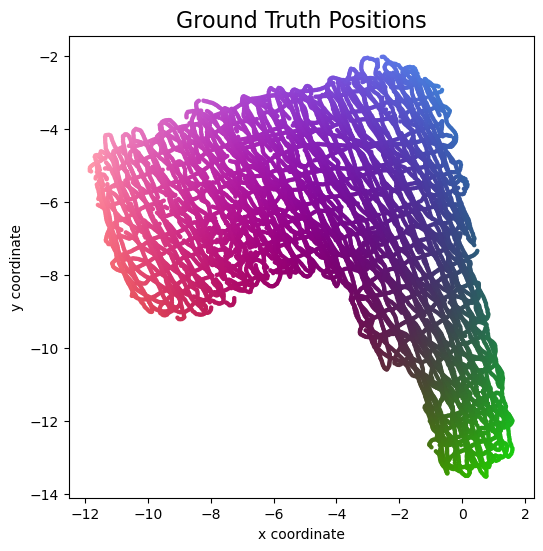

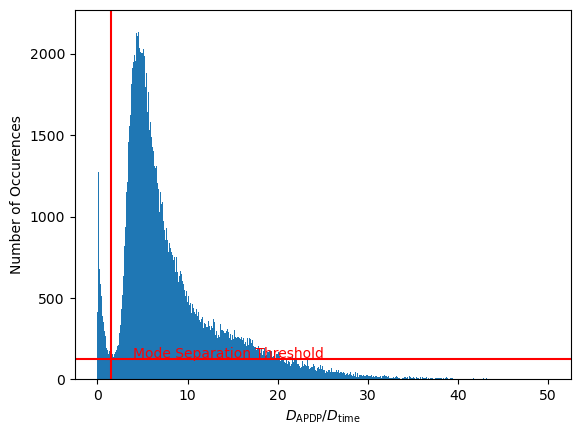

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733400599.778629  799995 service.cc:145] XLA service 0x7b5bf419f200 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733400599.778685  799995 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:09:59.892047: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:10:00.227978: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:10:01.041643: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 12ms/step - loss: 44.0094

I0000 00:00:1733400602.375203  799995 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.9568
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9857
TW: 0.9867
KS: 0.1370


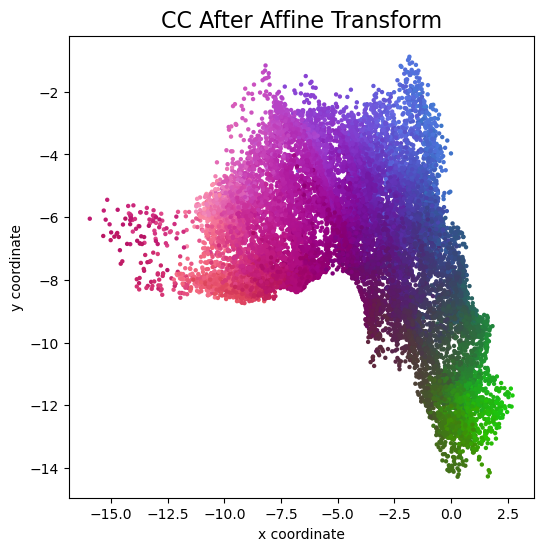

MAE: 0.6080
CEP: 0.5260
DRMS: 0.7750
Loss: 1.7651


2024-12-05 12:11:20.202048: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:11:21.056249: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:11:22.447330: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:11:22.503740: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:11:53.858618: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


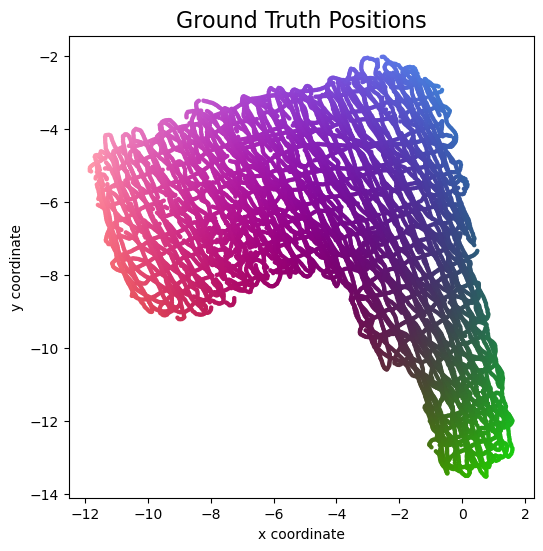

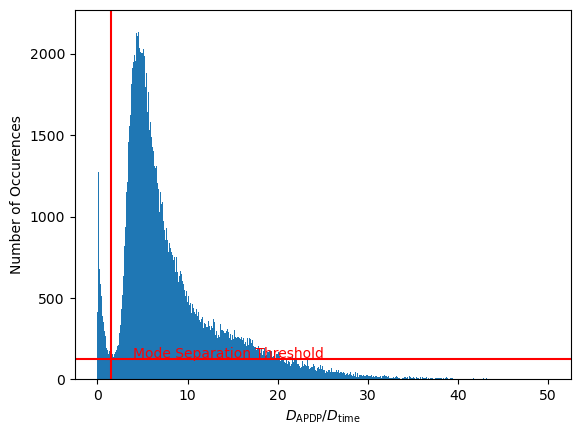

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733400860.648938  806446 service.cc:145] XLA service 0x7b5c1819ac70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733400860.648975  806446 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:14:20.764635: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:14:21.097572: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:14:21.897672: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 36s 12ms/step - loss: 41.5693

I0000 00:00:1733400863.234608  806446 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.8583
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9818
TW: 0.9834
KS: 0.1644


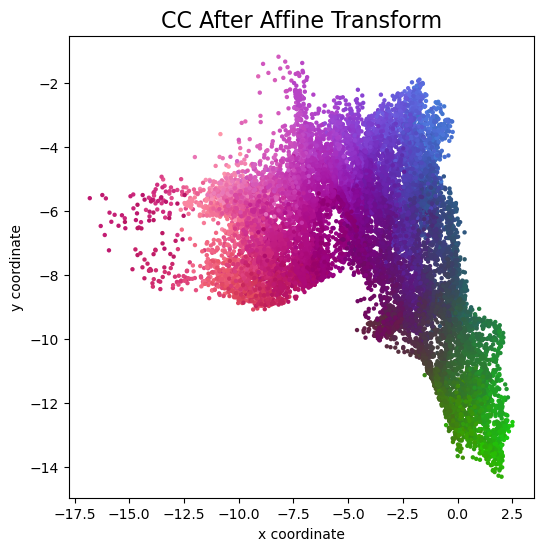

MAE: 0.6673
CEP: 0.5776
DRMS: 0.8540
Loss: 1.7363


2024-12-05 12:15:41.293134: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:15:42.104079: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:15:43.396461: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:15:43.448403: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:16:13.022664: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


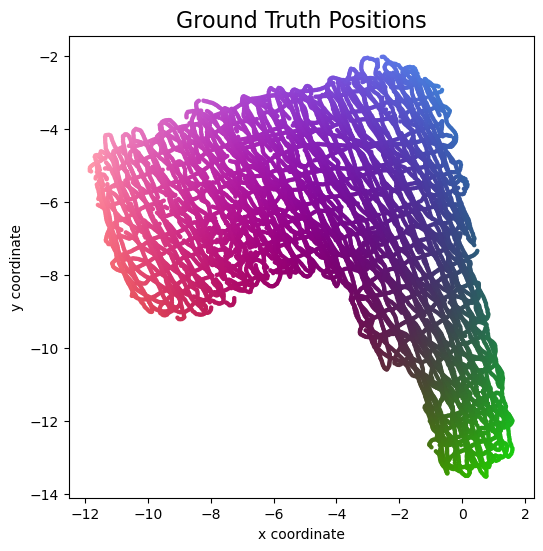

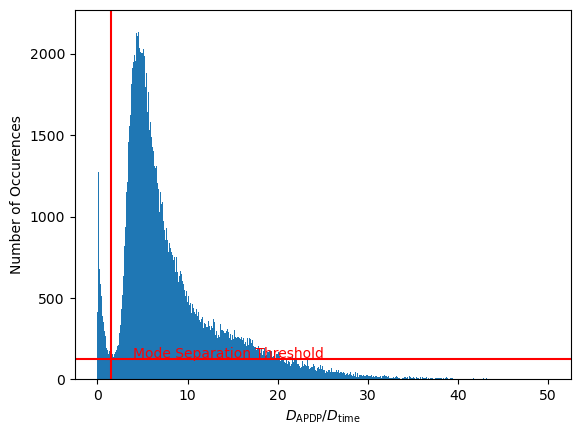

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733401120.085837  812887 service.cc:145] XLA service 0x7b5c0419dba0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733401120.085889  812887 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:18:40.223083: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:18:40.555999: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:18:41.379442: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 44.3460

I0000 00:00:1733401122.724091  812887 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.8903
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9842
TW: 0.9857
KS: 0.1602


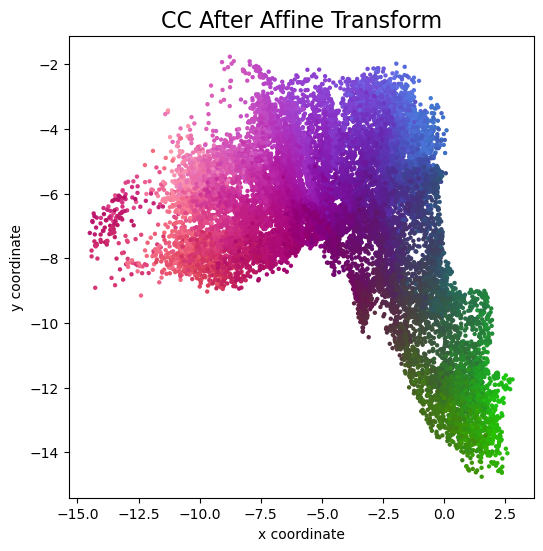

MAE: 0.6707
CEP: 0.5846
DRMS: 0.8285
Loss: 1.7481


2024-12-05 12:20:00.572062: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:20:01.360708: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:20:02.612093: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:20:02.663770: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:20:30.047441: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


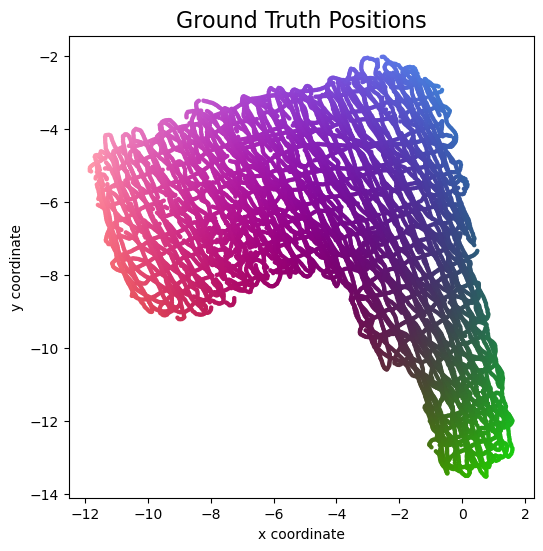

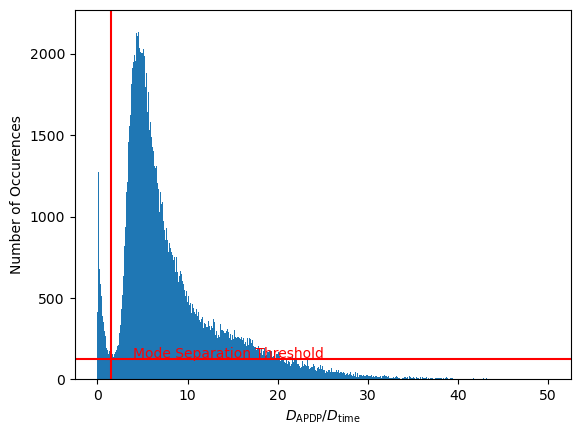

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733401379.720509  819326 service.cc:145] XLA service 0x7b5c201d8b20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733401379.720550  819326 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:22:59.823545: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:23:00.159268: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:23:00.950627: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 36s 12ms/step - loss: 42.5359

I0000 00:00:1733401382.294303  819326 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.9679
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9824
TW: 0.9842
KS: 0.1732


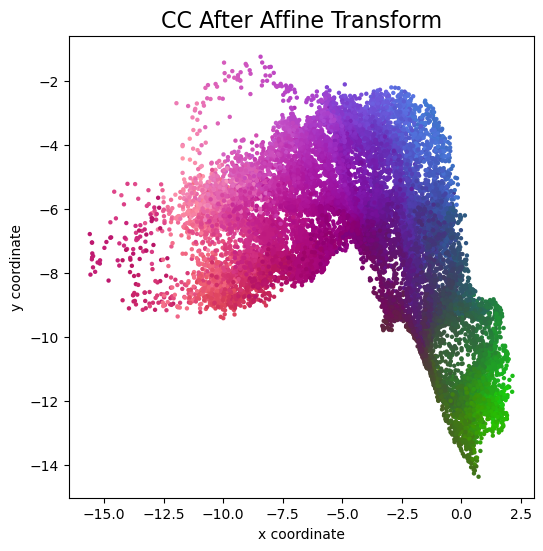

MAE: 0.6890
CEP: 0.6188
DRMS: 0.8525
Loss: 1.7662


2024-12-05 12:24:20.323544: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:24:21.147332: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:24:22.474173: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:24:22.527933: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:24:48.877139: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


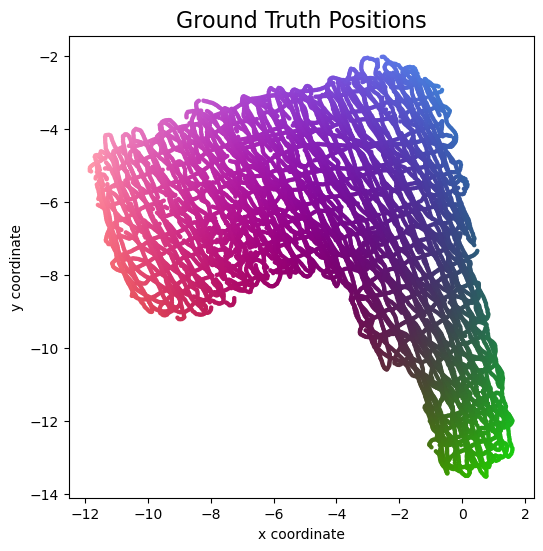

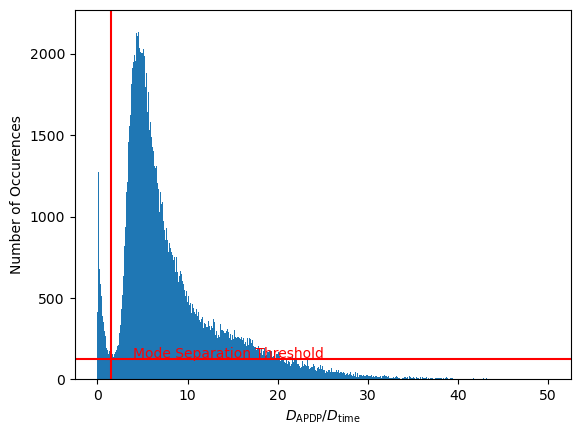

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733401636.010265  825795 service.cc:145] XLA service 0x7b5c101afe40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733401636.010322  825795 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:27:16.136857: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:27:16.466321: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:27:17.249077: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 36s 12ms/step - loss: 45.5149

I0000 00:00:1733401638.597657  825795 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0661
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9827
TW: 0.9853
KS: 0.1730


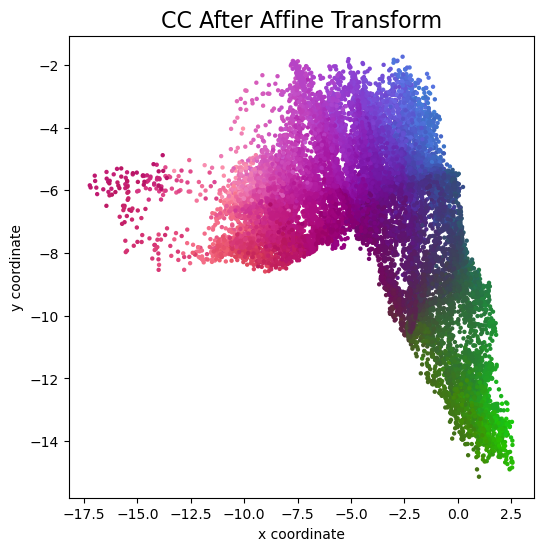

MAE: 0.7142
CEP: 0.6197
DRMS: 0.9368
Loss: 1.7766


2024-12-05 12:28:36.490241: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:28:37.312275: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:28:38.612241: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:28:38.666308: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:29:04.831737: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


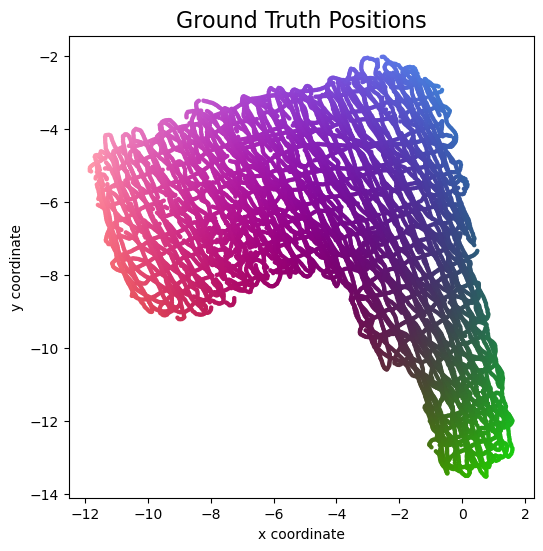

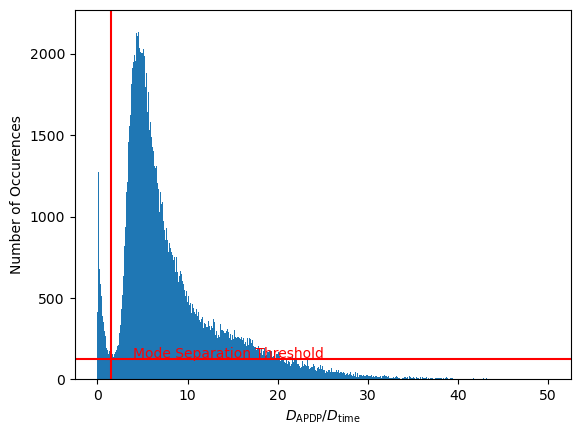

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733401890.820436  832223 service.cc:145] XLA service 0x7b5c14145ce0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733401890.820468  832223 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:31:30.920958: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:31:31.252990: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:31:32.061729: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  13/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 13ms/step - loss: 46.2417

I0000 00:00:1733401893.408329  832223 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.9593
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9844
TW: 0.9857
KS: 0.1651


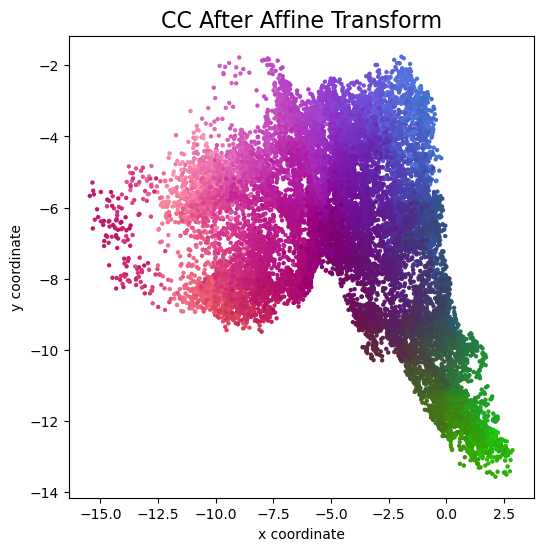

MAE: 0.6449
CEP: 0.5609
DRMS: 0.8320
Loss: 1.7518


2024-12-05 12:32:51.726184: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:32:52.545665: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:32:53.825490: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:32:53.880075: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:33:21.158147: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


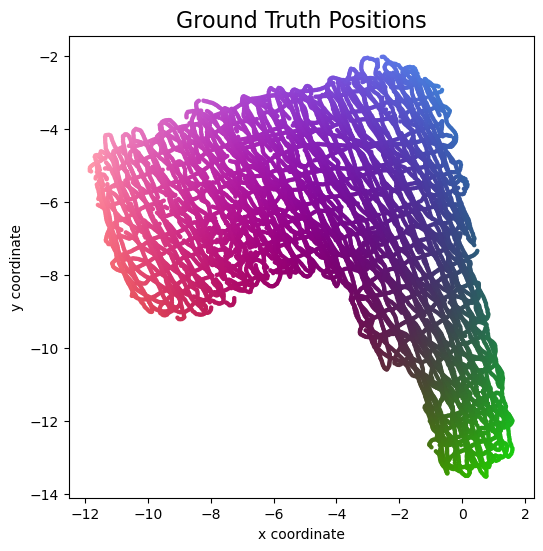

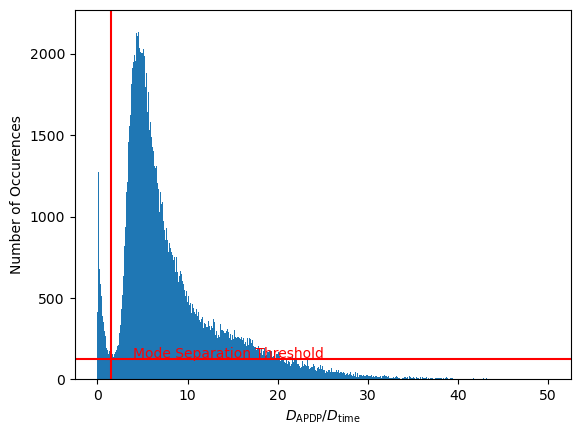

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733402151.183454  838694 service.cc:145] XLA service 0x7b5c08195890 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733402151.183514  838694 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:35:51.310561: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:35:51.645634: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:35:52.447021: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 45.4031

I0000 00:00:1733402153.798704  838694 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.1983
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9815
TW: 0.9845
KS: 0.1747


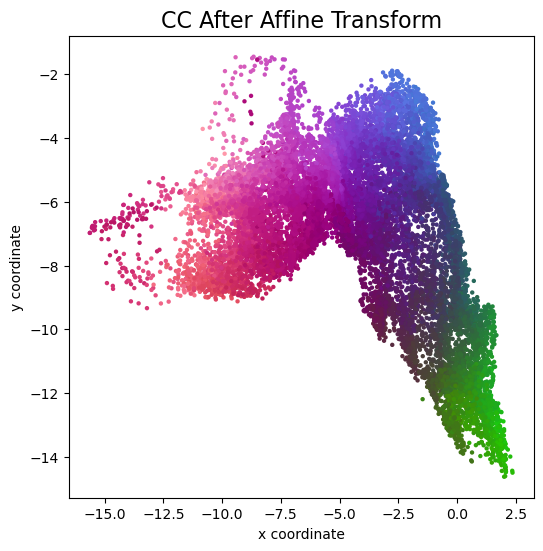

MAE: 0.7369
CEP: 0.6364
DRMS: 0.9226
Loss: 1.8212


2024-12-05 12:37:12.162676: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:37:13.003822: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:37:14.383192: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:37:14.442709: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:38:12.909793: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


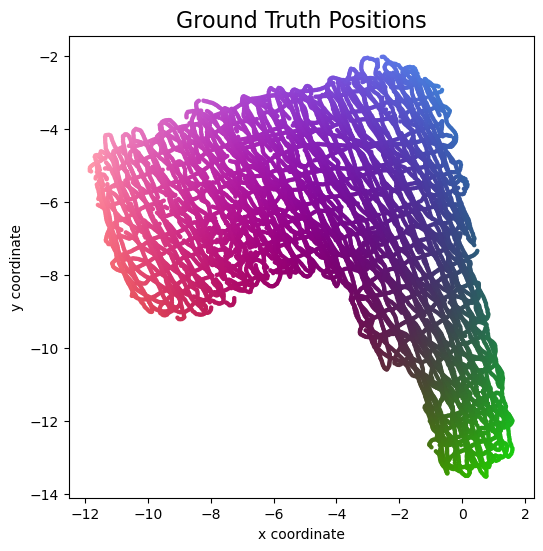

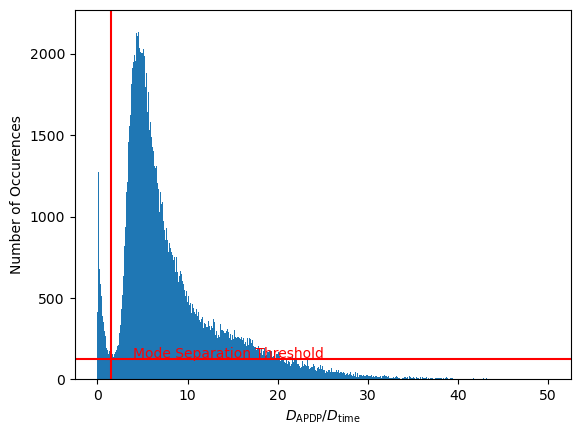

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733402438.268268  845161 service.cc:145] XLA service 0x7b5c241c1a80 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733402438.268324  845161 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:40:38.393268: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:40:38.722825: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:40:39.517832: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  13/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 45.4088

I0000 00:00:1733402440.859679  845161 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.9344
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9836
TW: 0.9842
KS: 0.1743


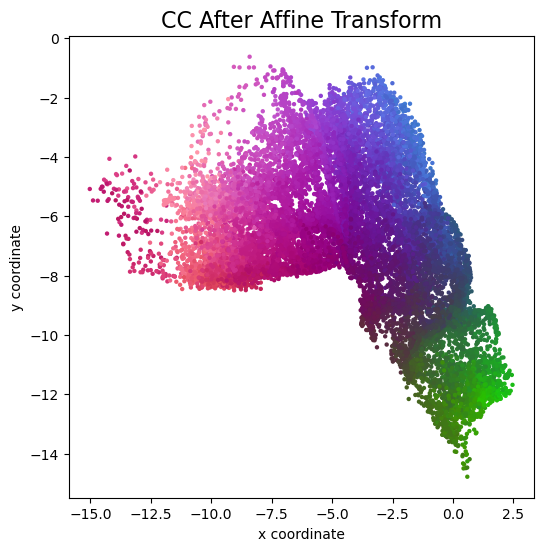

MAE: 0.6486
CEP: 0.5654
DRMS: 0.8198
Loss: 1.7596


2024-12-05 12:41:58.890753: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:41:59.703803: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:42:01.003425: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:42:01.057707: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:42:26.604396: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


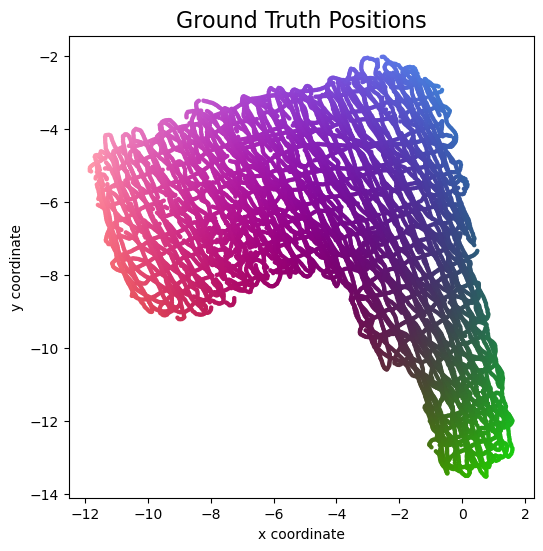

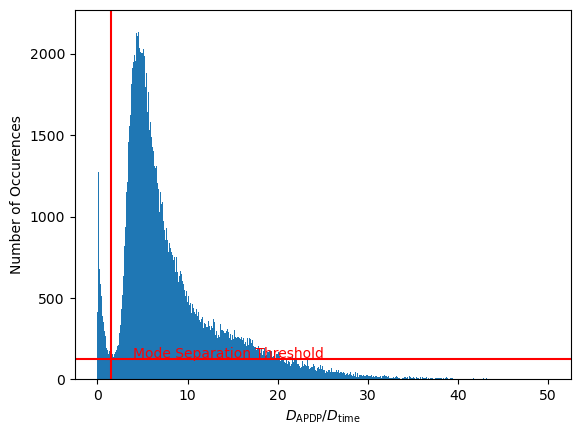

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733402694.622265  851614 service.cc:145] XLA service 0x7b5c2819bc10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733402694.622304  851614 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:44:54.738580: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:44:55.069948: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:44:55.872316: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 46.0287

I0000 00:00:1733402697.222461  851614 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0335
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9831
TW: 0.9845
KS: 0.1697


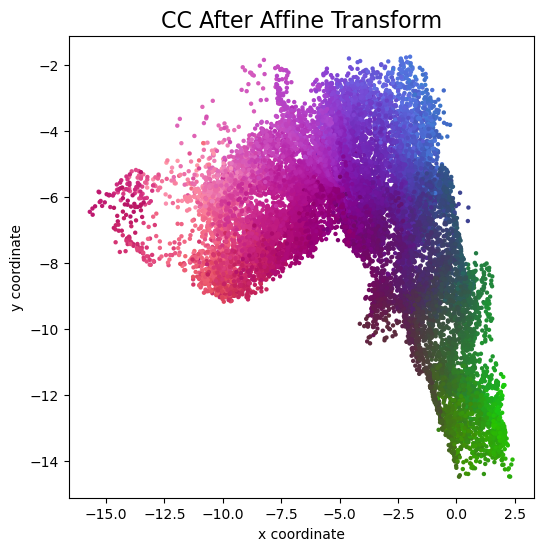

MAE: 0.6929
CEP: 0.6075
DRMS: 0.8815
Loss: 1.7826


2024-12-05 12:46:15.533854: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:46:16.358134: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:46:17.649322: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:46:17.702149: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:46:44.707865: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


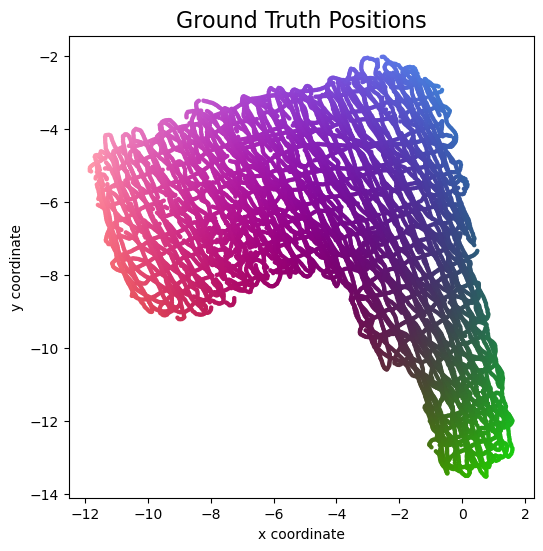

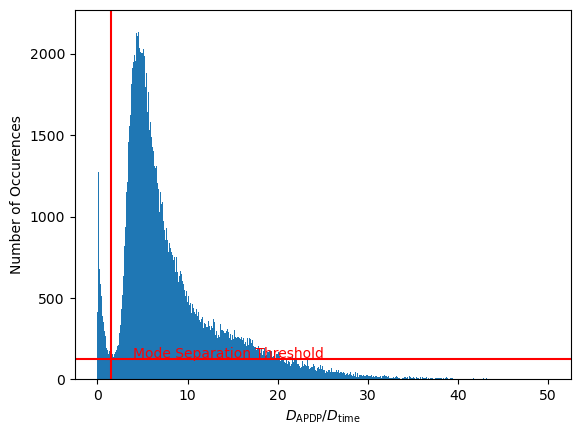

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733402952.466411  858076 service.cc:145] XLA service 0x7b5c001b47b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733402952.466464  858076 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:49:12.591325: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:49:12.918459: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:49:13.698362: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 12ms/step - loss: 43.9551

I0000 00:00:1733402955.030573  858076 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.1978
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9838
TW: 0.9861
KS: 0.1611


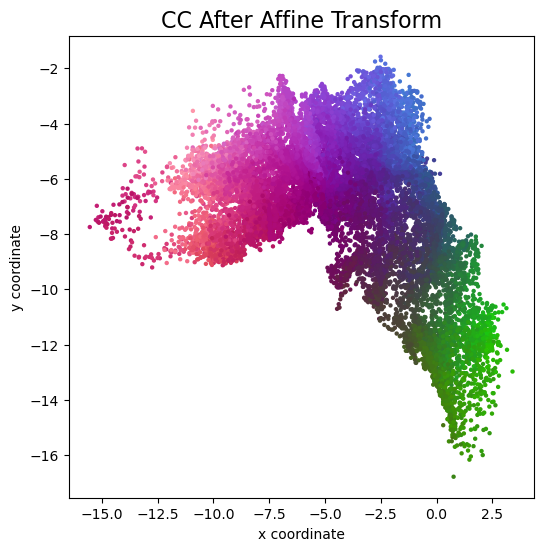

MAE: 0.7464
CEP: 0.6484
DRMS: 0.9211
Loss: 1.8314


2024-12-05 12:50:33.353418: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:50:34.180314: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:50:35.486919: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:50:35.541290: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:51:00.499996: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


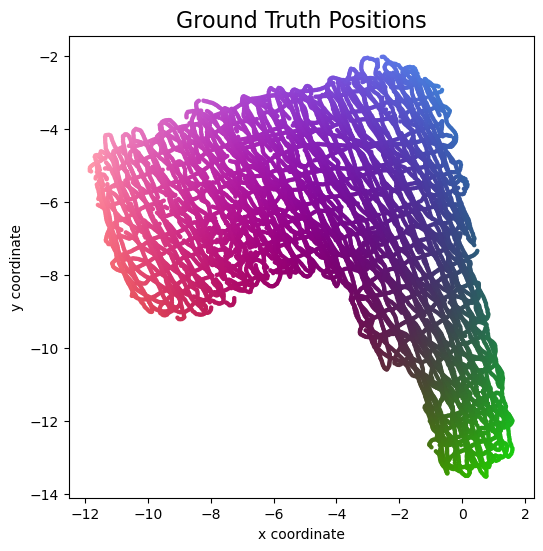

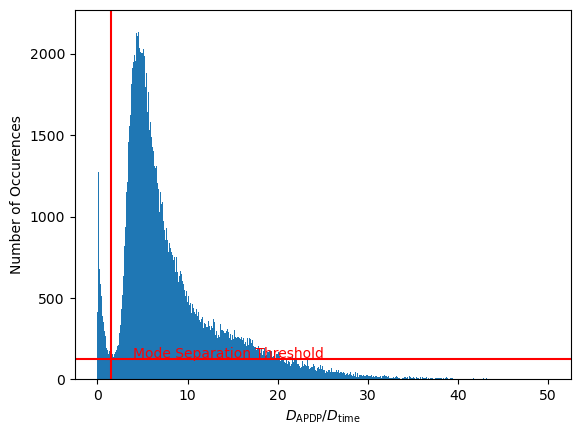

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733403205.885739  864512 service.cc:145] XLA service 0x7b5c18191d30 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733403205.885775  864512 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:53:25.992969: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:53:26.323079: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:53:27.108673: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 43.5242

I0000 00:00:1733403208.448858  864512 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.1009
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9818
TW: 0.9837
KS: 0.1948


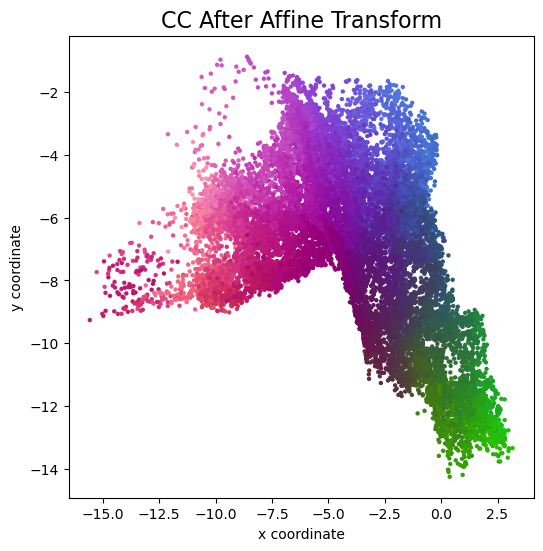

MAE: 0.7338
CEP: 0.6594
DRMS: 0.8903
Loss: 1.8160


2024-12-05 12:54:46.522398: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:54:47.368445: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:54:48.658393: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:54:48.710890: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:55:14.799559: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


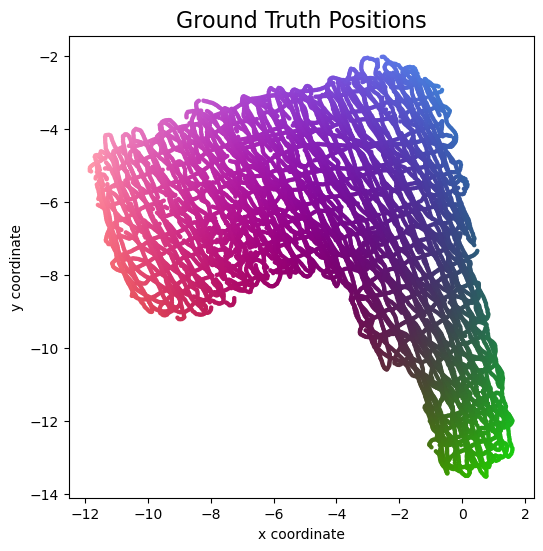

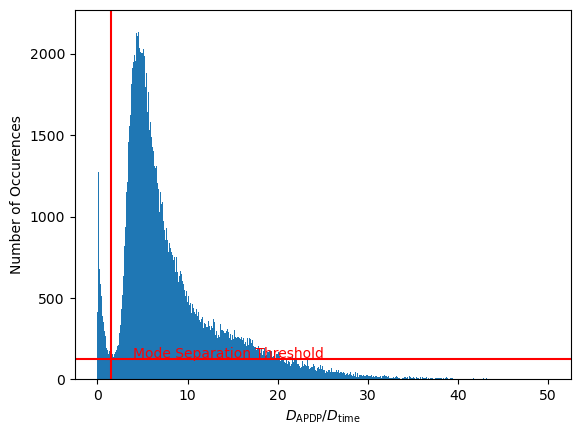

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733403459.880556  870929 service.cc:145] XLA service 0x7b5bf988e630 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733403459.880594  870929 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 12:57:39.983452: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 12:57:40.311112: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 12:57:41.088646: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 45.5034

I0000 00:00:1733403462.438394  870929 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.1361
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9818
TW: 0.9856
KS: 0.1769


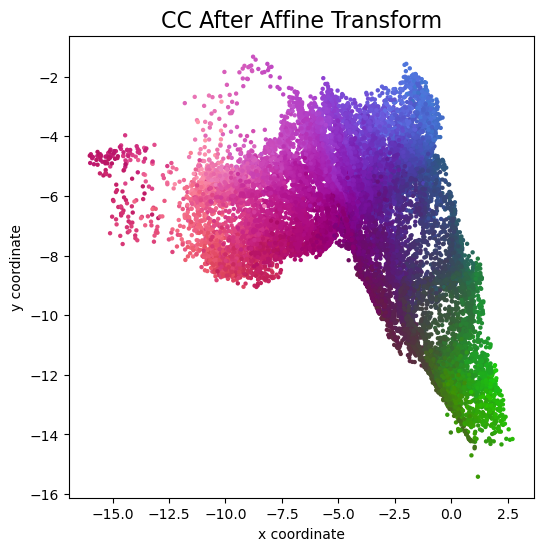

MAE: 0.7173
CEP: 0.6267
DRMS: 0.9324
Loss: 1.8003


2024-12-05 12:59:00.520278: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 12:59:01.345004: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 12:59:02.640735: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 12:59:02.694278: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 12:59:27.807153: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


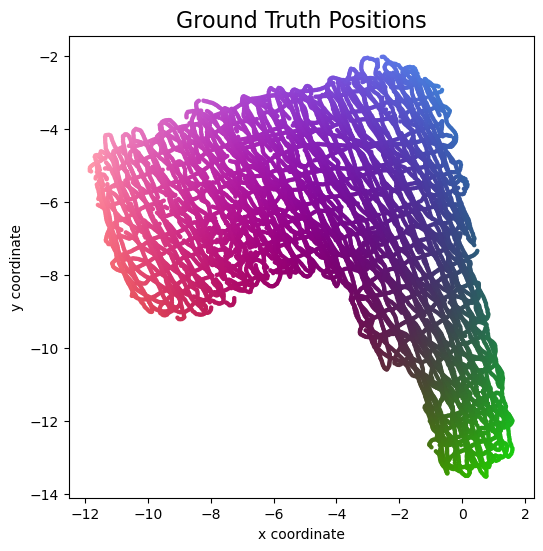

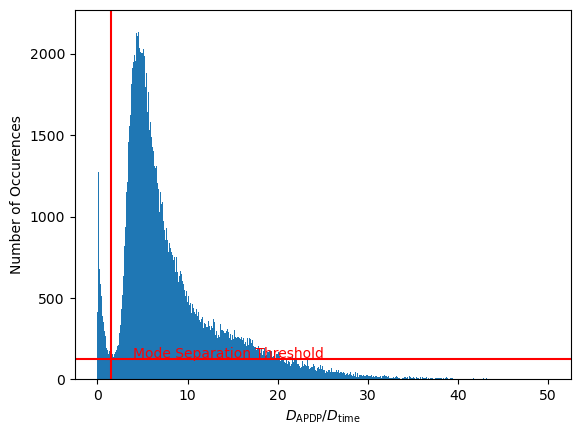

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733403717.359326  877338 service.cc:145] XLA service 0x7b5bfd6ccf40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733403717.359381  877338 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:01:57.482006: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:01:57.821198: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:01:58.617937: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 45.5517

I0000 00:00:1733403719.958325  877338 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 25ms/step - loss: 3.1004
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9842
TW: 0.9850
KS: 0.1697


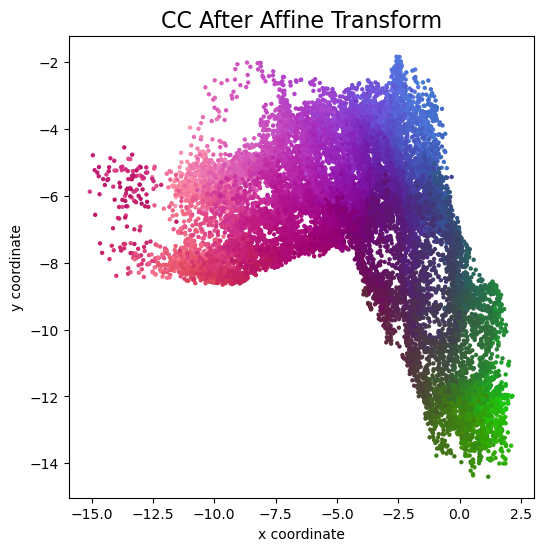

MAE: 0.6997
CEP: 0.6249
DRMS: 0.8595
Loss: 1.7956


2024-12-05 13:03:18.567841: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:03:19.407519: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:03:20.718781: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:03:20.773558: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:04:08.725178: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


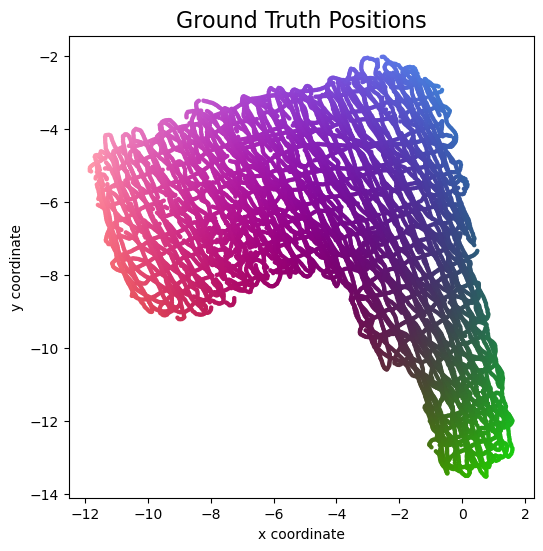

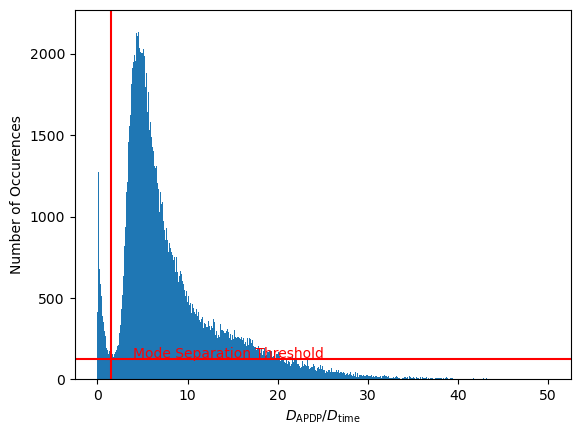

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733403995.796574  883791 service.cc:145] XLA service 0x7b5c1c1f0b90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733403995.796621  883791 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:06:35.910291: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:06:36.238301: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:06:36.986294: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 12ms/step - loss: 45.2496

I0000 00:00:1733403998.319744  883791 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.1144
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9804
TW: 0.9837
KS: 0.1890


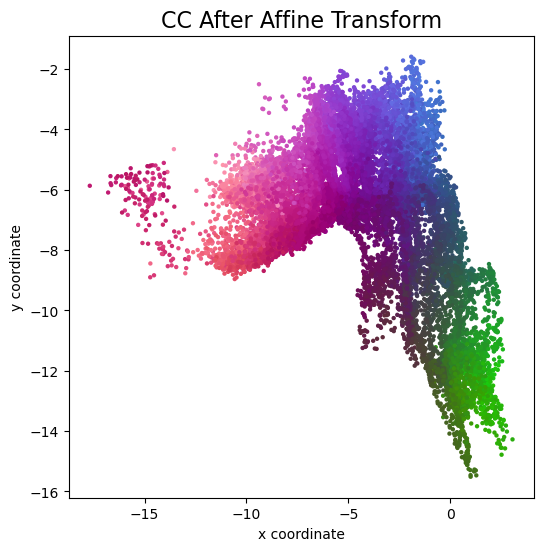

MAE: 0.7761
CEP: 0.6856
DRMS: 0.9917
Loss: 1.8018


2024-12-05 13:07:56.323744: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:07:57.120613: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:07:58.392047: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:07:58.443912: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:08:23.489791: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


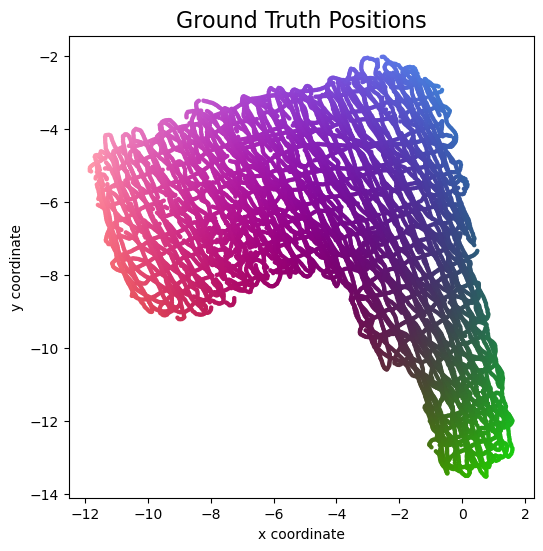

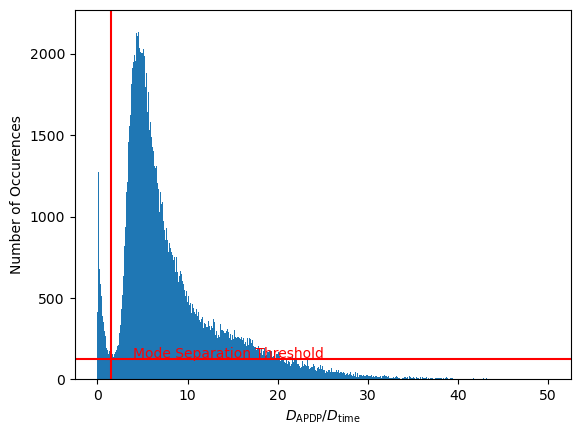

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733404248.219793  890277 service.cc:145] XLA service 0x7b5c2419f380 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733404248.219851  890277 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:10:48.345572: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:10:48.678526: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:10:49.471690: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 13ms/step - loss: 43.9852

I0000 00:00:1733404250.819253  890277 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0518
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9835
TW: 0.9858
KS: 0.1747


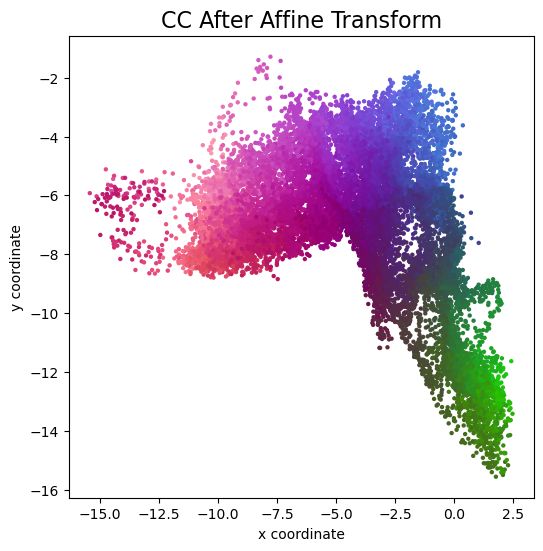

MAE: 0.7550
CEP: 0.6668
DRMS: 0.9426
Loss: 1.7793


2024-12-05 13:12:08.914662: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:12:09.698600: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:12:10.934705: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:12:10.989231: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:12:36.406986: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


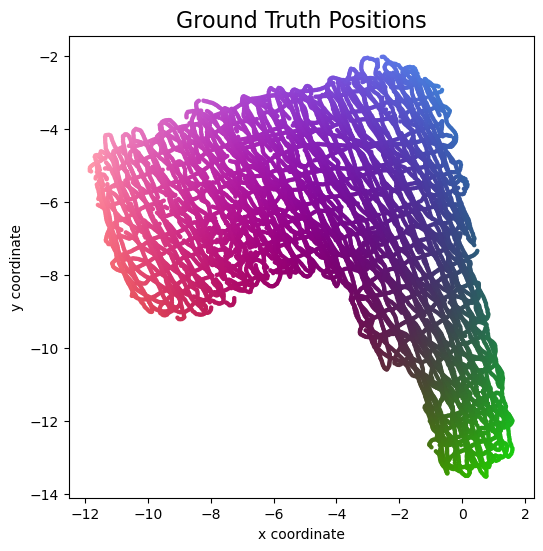

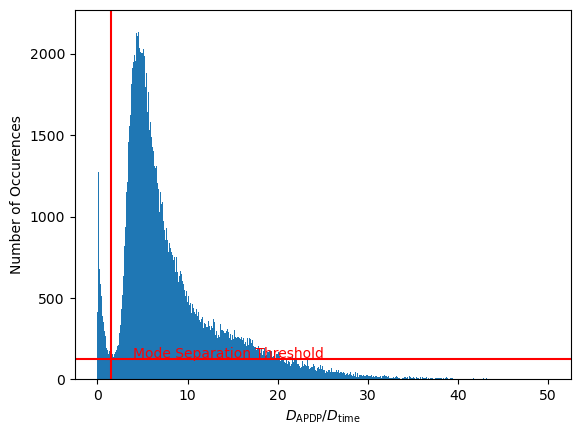

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733404502.005249  896711 service.cc:145] XLA service 0x7b5c181cd8f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733404502.005302  896711 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:15:02.129500: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:15:02.469442: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:15:03.265512: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 36s 12ms/step - loss: 42.7958

I0000 00:00:1733404504.599211  896711 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0386
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9825
TW: 0.9846
KS: 0.1896


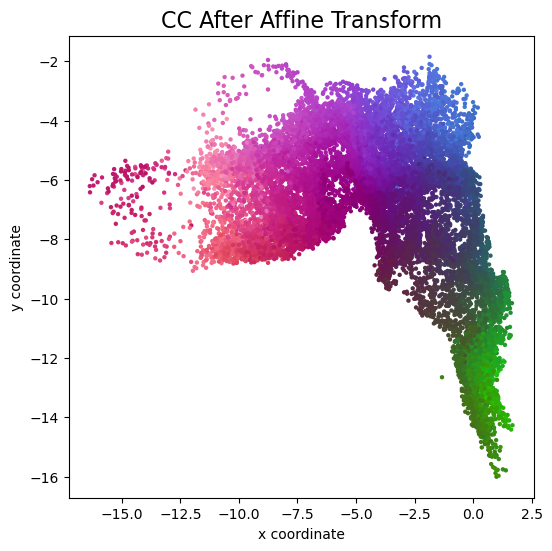

MAE: 0.7338
CEP: 0.6493
DRMS: 0.9325
Loss: 1.7863


2024-12-05 13:16:22.772864: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:16:23.601299: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:16:24.924524: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:16:24.982220: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:16:50.029922: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


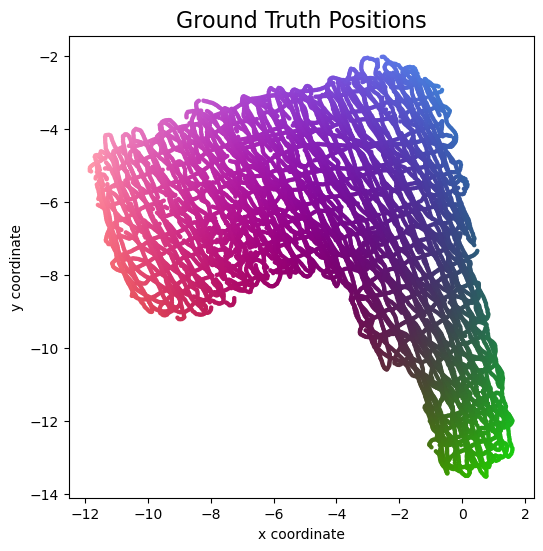

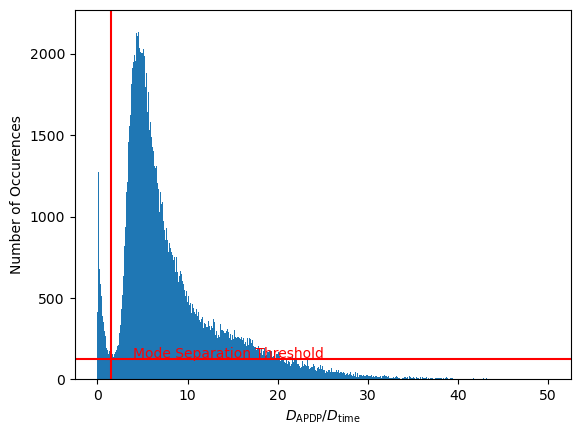

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733404756.784457  903155 service.cc:145] XLA service 0x7b5c0019e960 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733404756.784512  903155 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:19:16.909020: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:19:17.245079: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:19:18.039590: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 36s 12ms/step - loss: 42.9829

I0000 00:00:1733404759.385363  903155 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0317
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9806
TW: 0.9847
KS: 0.1978


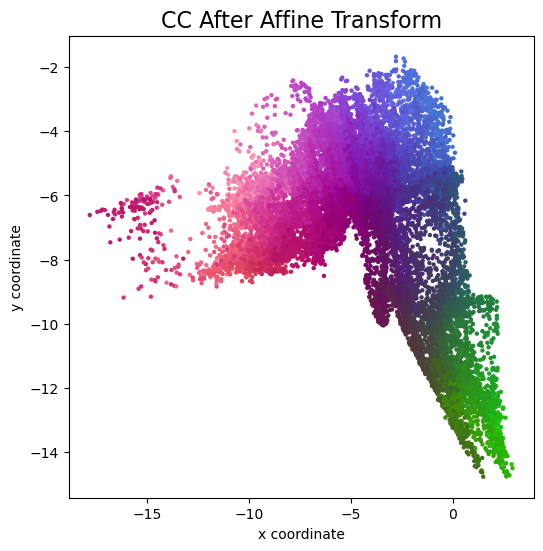

MAE: 0.7948
CEP: 0.7149
DRMS: 1.0141
Loss: 1.7794


2024-12-05 13:20:37.162465: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:20:37.966809: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:20:39.308110: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:20:39.361798: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:21:04.525553: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


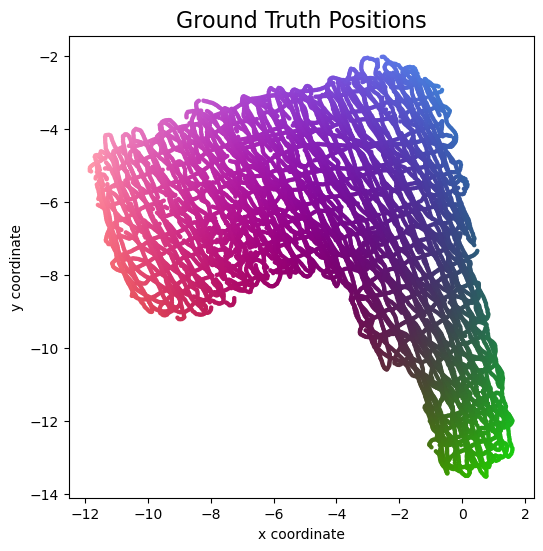

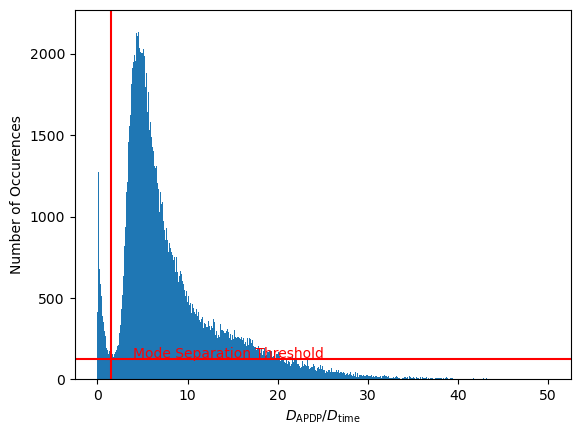

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733405010.062162  909611 service.cc:145] XLA service 0x7b5bf984fba0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733405010.062220  909611 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:23:30.186939: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:23:30.528569: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:23:31.304628: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  13/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 45.8350

I0000 00:00:1733405012.643761  909611 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.9572
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9829
TW: 0.9849
KS: 0.1911


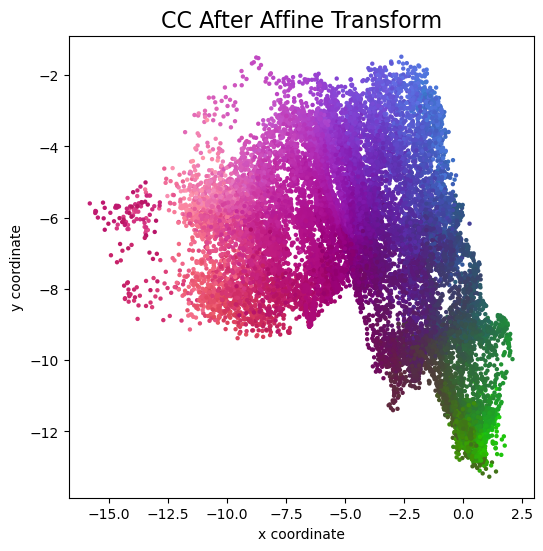

MAE: 0.6535
CEP: 0.5845
DRMS: 0.8315
Loss: 1.7626


2024-12-05 13:24:50.595025: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:24:51.411621: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:24:52.759925: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:24:52.813494: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:25:18.169135: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


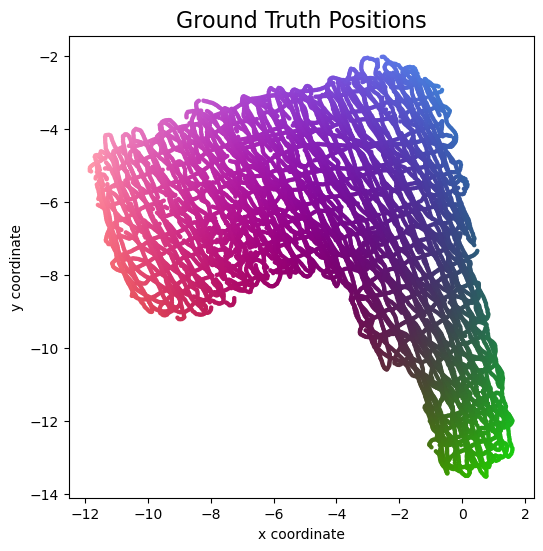

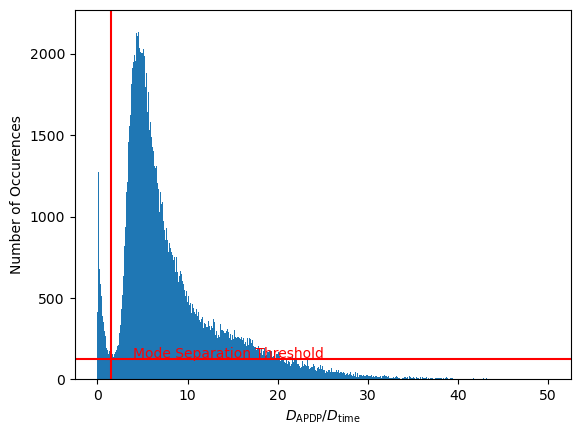

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733405263.450231  916034 service.cc:145] XLA service 0x7b5c141be7d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733405263.450271  916034 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:27:43.543893: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:27:43.870120: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:27:44.655602: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 43.5615

I0000 00:00:1733405265.986588  916034 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 78s 24ms/step - loss: 3.0948
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9809
TW: 0.9842
KS: 0.1815


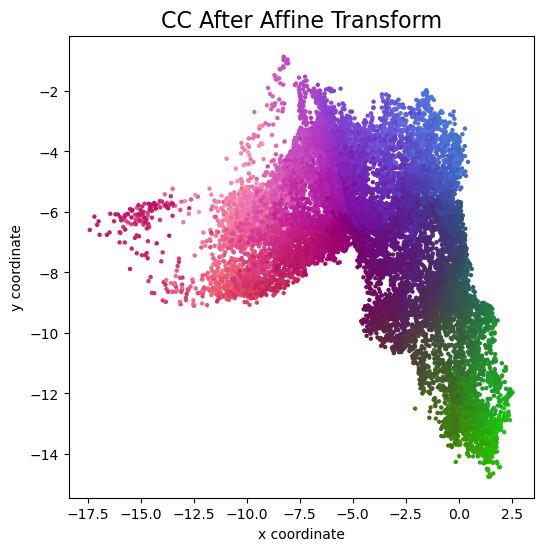

MAE: 0.7796
CEP: 0.7174
DRMS: 0.9754
Loss: 1.7947


2024-12-05 13:29:04.088884: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:29:04.892931: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:29:06.177111: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:29:06.230949: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:29:31.407515: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


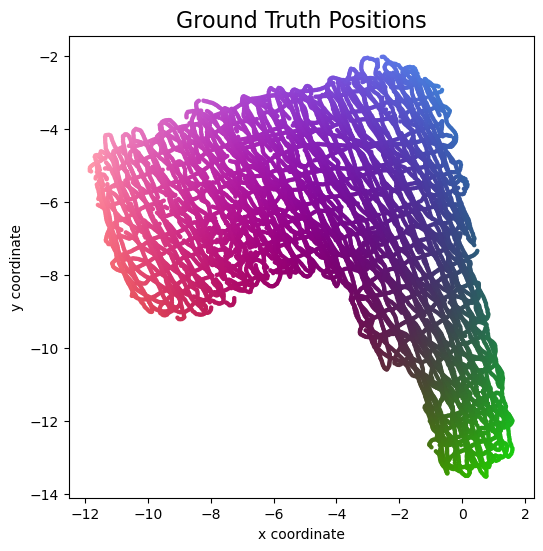

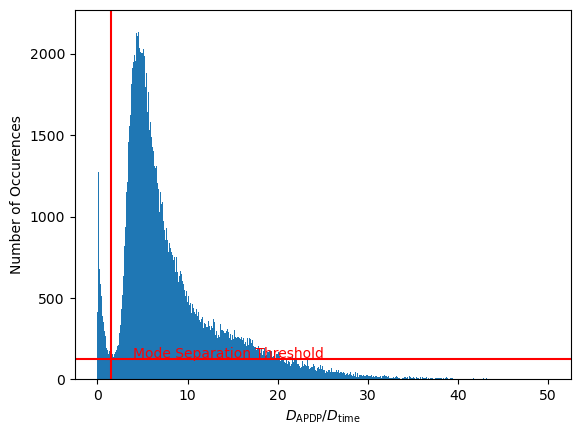

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733405516.791956  922432 service.cc:145] XLA service 0x7b5c1c192f20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733405516.792012  922432 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:31:56.916763: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:31:57.248158: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:31:58.043467: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 12ms/step - loss: 42.5270

I0000 00:00:1733405519.390425  922432 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0494
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9840
TW: 0.9860
KS: 0.1633


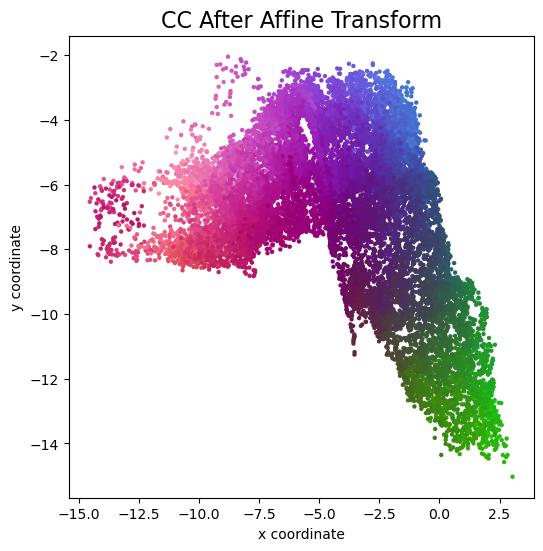

MAE: 0.6666
CEP: 0.5845
DRMS: 0.8312
Loss: 1.7834


2024-12-05 13:33:17.471249: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:33:18.297871: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:33:19.622743: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:33:19.677517: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:33:45.978327: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


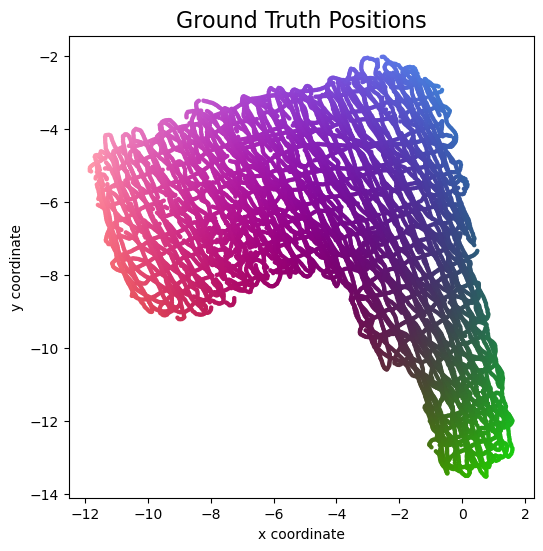

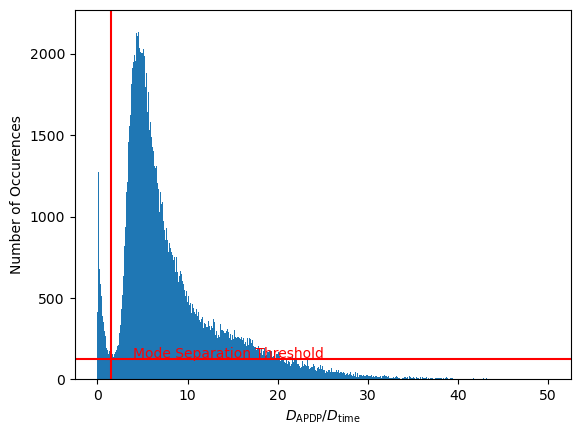

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733405770.468456  928889 service.cc:145] XLA service 0x7b5c0419e710 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733405770.468507  928889 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:36:10.592786: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:36:10.919822: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:36:11.698979: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 39s 13ms/step - loss: 45.1362

I0000 00:00:1733405773.036653  928889 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.1197
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9821
TW: 0.9848
KS: 0.1655


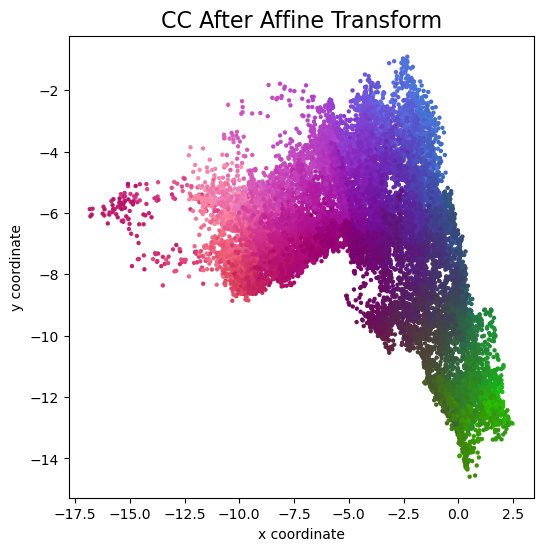

MAE: 0.6666
CEP: 0.5654
DRMS: 0.8767
Loss: 1.8151


2024-12-05 13:37:31.392563: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:37:32.218038: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:37:33.541985: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:37:33.596740: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:37:59.112103: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


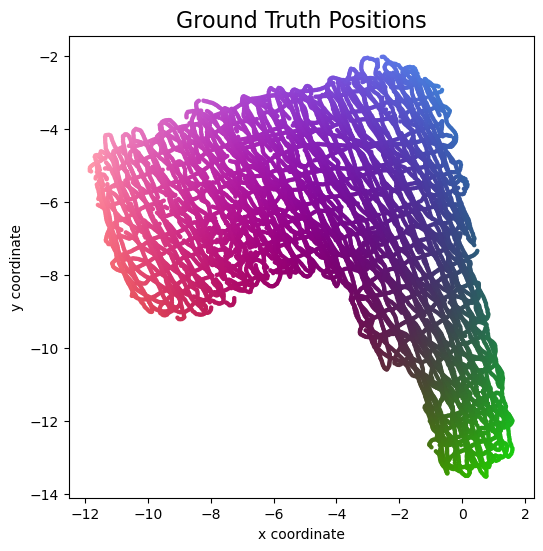

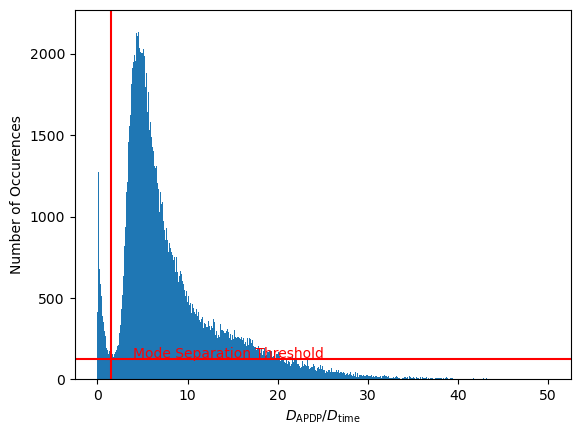

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733406026.765111  935309 service.cc:145] XLA service 0x7b5c0419ecd0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733406026.765165  935309 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:40:26.901952: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:40:27.240992: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:40:28.059226: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 46.3882

I0000 00:00:1733406029.414275  935309 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0676
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9843
TW: 0.9865
KS: 0.1706


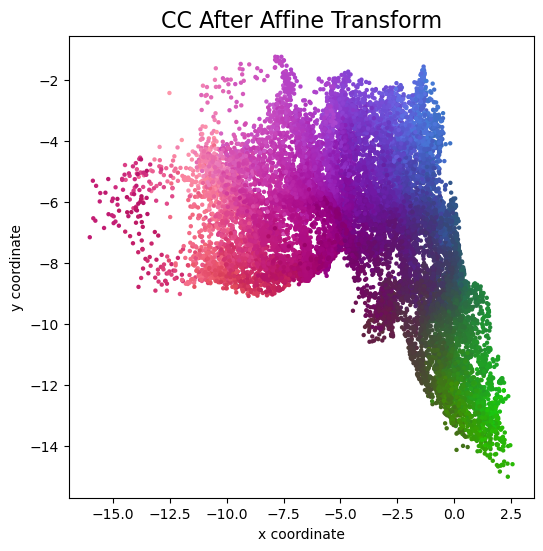

MAE: 0.6091
CEP: 0.5220
DRMS: 0.7962
Loss: 1.7793


2024-12-05 13:41:47.732089: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:41:48.547699: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:41:49.842124: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:41:49.899129: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:42:31.340525: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


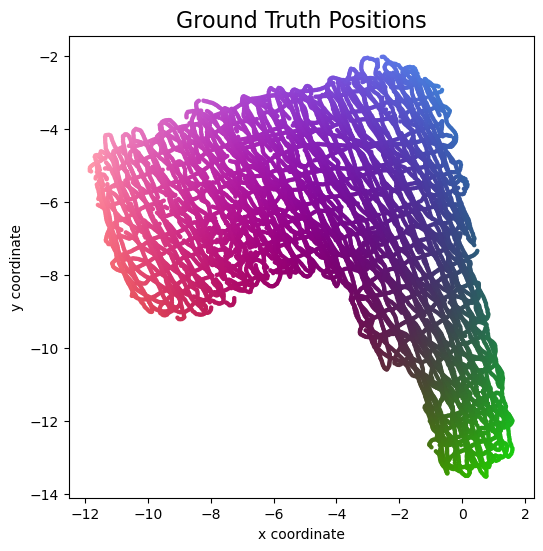

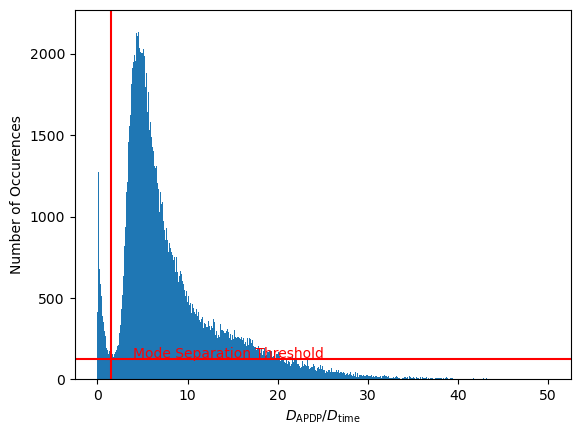

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733406295.746597  941759 service.cc:145] XLA service 0x7b5c1c1ceeb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733406295.746649  941759 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:44:55.853337: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:44:56.186905: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:44:56.938644: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 13ms/step - loss: 42.7284

I0000 00:00:1733406298.272831  941759 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0403
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9835
TW: 0.9860
KS: 0.1563


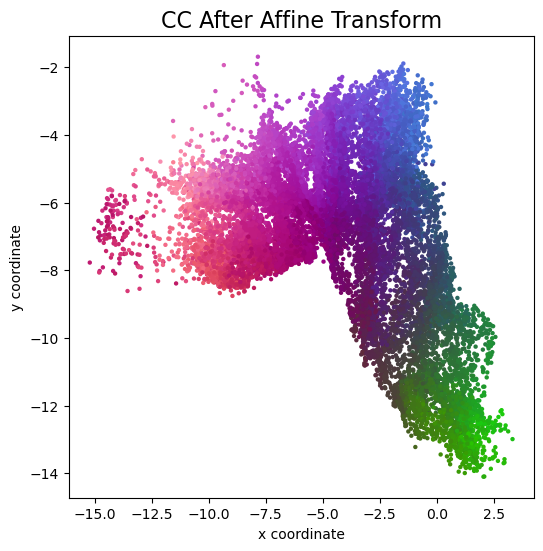

MAE: 0.6588
CEP: 0.5732
DRMS: 0.8379
Loss: 1.7872


2024-12-05 13:46:16.107504: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:46:16.903558: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:46:18.146577: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:46:18.198545: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:46:43.937372: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


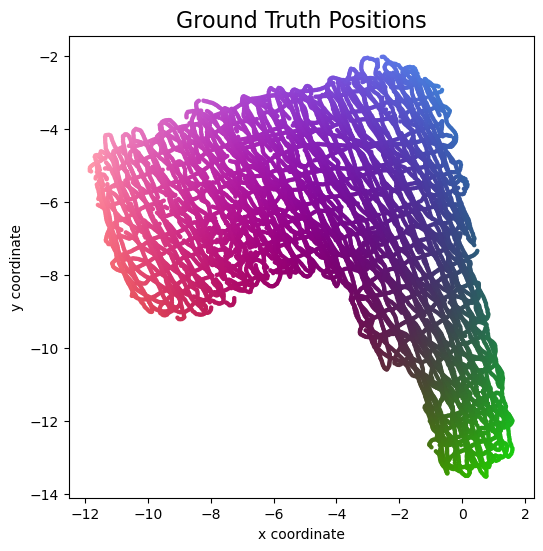

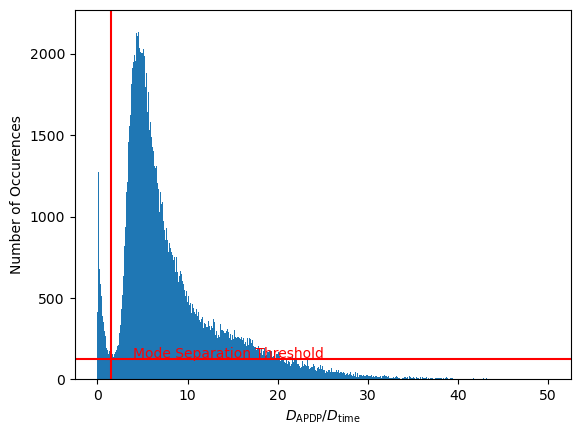

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733406548.667480  948172 service.cc:145] XLA service 0x7b5c047e1d60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733406548.667537  948172 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:49:08.784294: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:49:09.132586: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:49:09.925552: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 13ms/step - loss: 42.0532

I0000 00:00:1733406551.255468  948172 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.9348
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9845
TW: 0.9864
KS: 0.1587


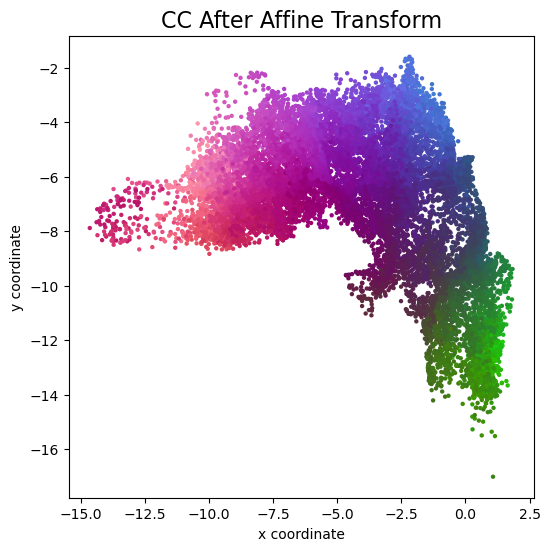

MAE: 0.5999
CEP: 0.5129
DRMS: 0.7651
Loss: 1.7704


2024-12-05 13:50:29.530008: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:50:30.368381: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:50:31.656507: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:50:31.708130: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:51:02.413371: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


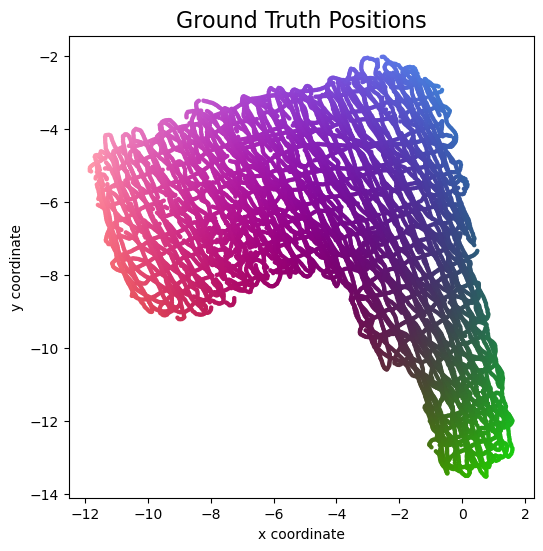

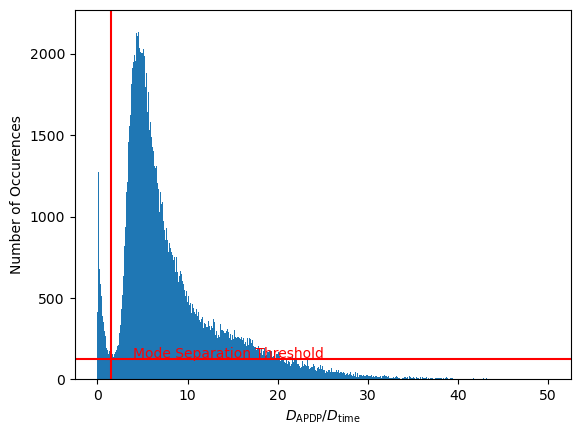

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733406807.591887  954621 service.cc:145] XLA service 0x7b5c2010e950 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733406807.591926  954621 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:53:27.687879: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:53:28.020738: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:53:28.811282: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 36s 12ms/step - loss: 42.0320

I0000 00:00:1733406810.157867  954621 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.8589
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9846
TW: 0.9868
KS: 0.1767


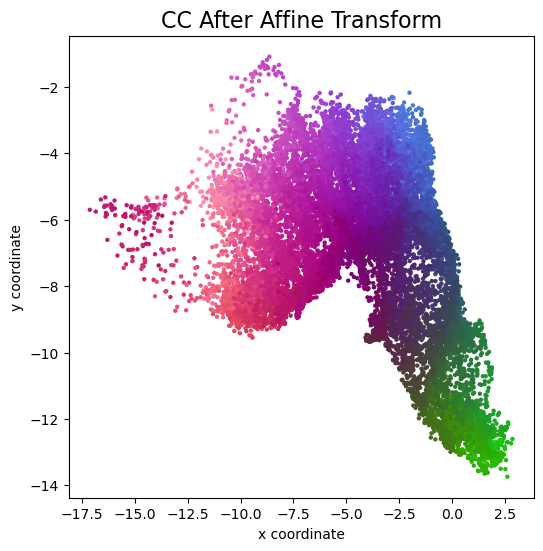

MAE: 0.6484
CEP: 0.5554
DRMS: 0.8635
Loss: 1.7385


2024-12-05 13:54:48.316016: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:54:49.121131: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:54:50.431776: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:54:50.489425: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:55:15.416179: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


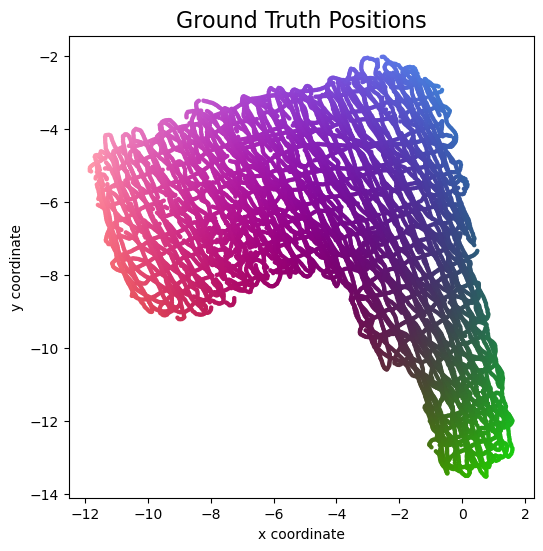

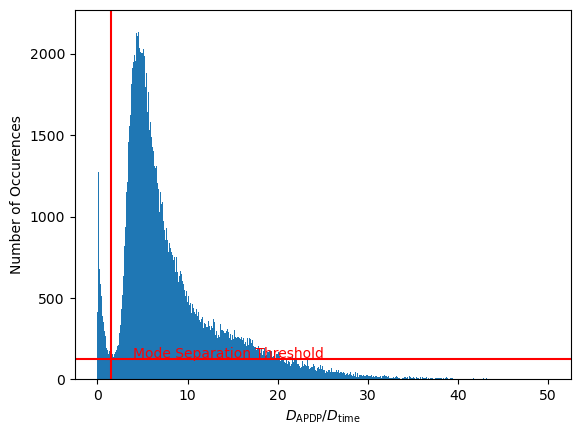

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733407058.667287  961072 service.cc:145] XLA service 0x7b5c180d3cc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733407058.667328  961072 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 13:57:38.773425: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 13:57:39.111815: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 13:57:39.896494: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 13ms/step - loss: 43.2071

I0000 00:00:1733407061.237646  961072 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 78s 24ms/step - loss: 3.0213
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9818
TW: 0.9838
KS: 0.2007


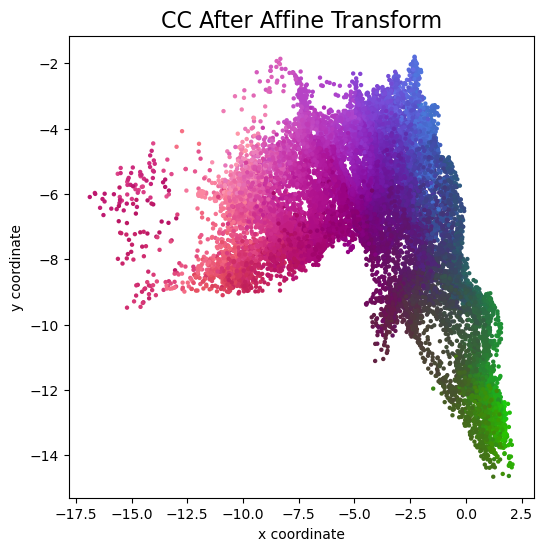

MAE: 0.7833
CEP: 0.6960
DRMS: 0.9815
Loss: 1.7752


2024-12-05 13:58:59.390126: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 13:59:00.246134: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 13:59:01.566466: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 13:59:01.620323: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 13:59:33.863695: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


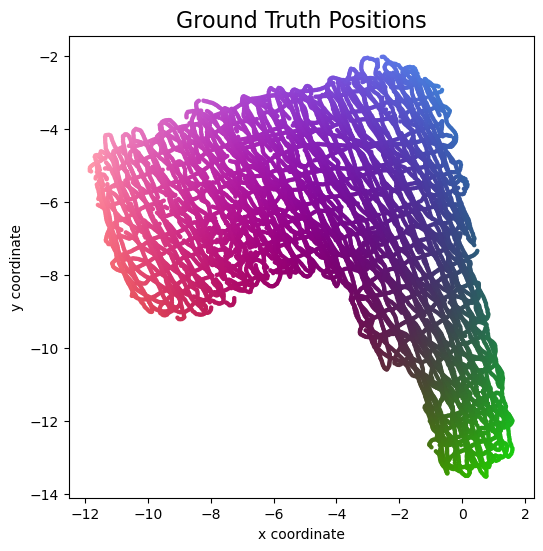

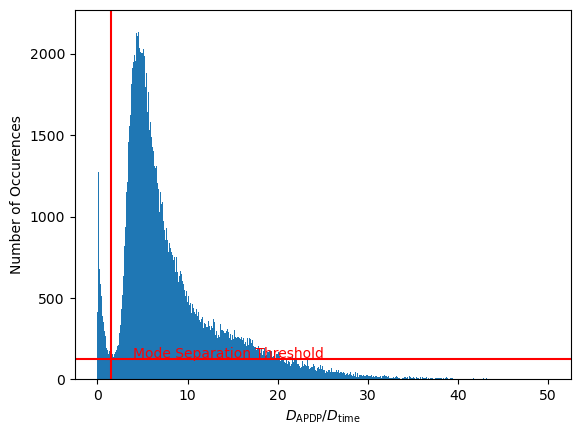

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733407318.565553  967502 service.cc:145] XLA service 0x7b5c1c2efcf0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733407318.565630  967502 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 14:01:58.695281: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 14:01:59.022728: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 14:01:59.798283: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 44.6415

I0000 00:00:1733407321.139529  967502 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 2.9142
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9829
TW: 0.9849
KS: 0.1508


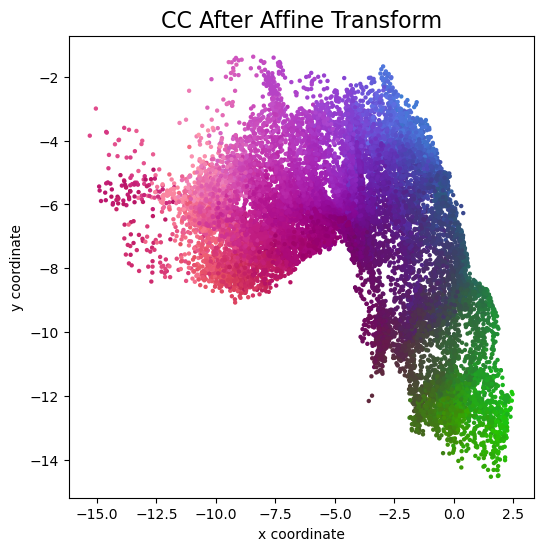

MAE: 0.6693
CEP: 0.5853
DRMS: 0.8412
Loss: 1.7494


2024-12-05 14:03:19.368213: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 14:03:20.182639: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 14:03:21.513149: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 14:03:21.566658: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 14:03:47.447441: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


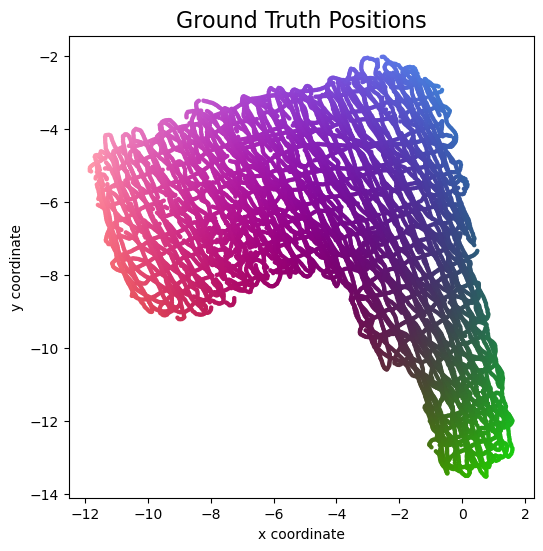

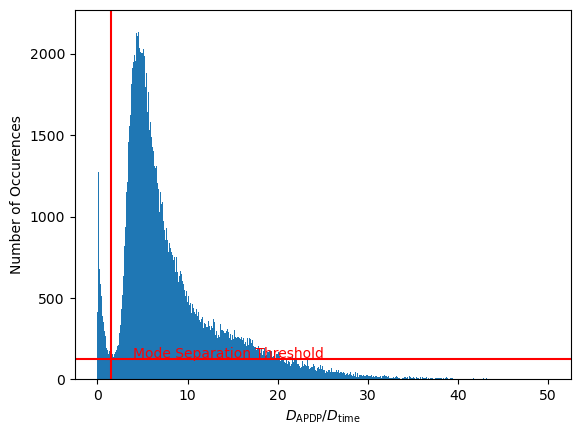

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733407574.772995  973965 service.cc:145] XLA service 0x7b5bf56a1530 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733407574.773038  973965 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 14:06:14.884643: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 14:06:15.238507: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 14:06:16.041302: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 37s 12ms/step - loss: 40.3961

I0000 00:00:1733407577.387207  973965 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 25ms/step - loss: 2.9218
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9838
TW: 0.9869
KS: 0.1935


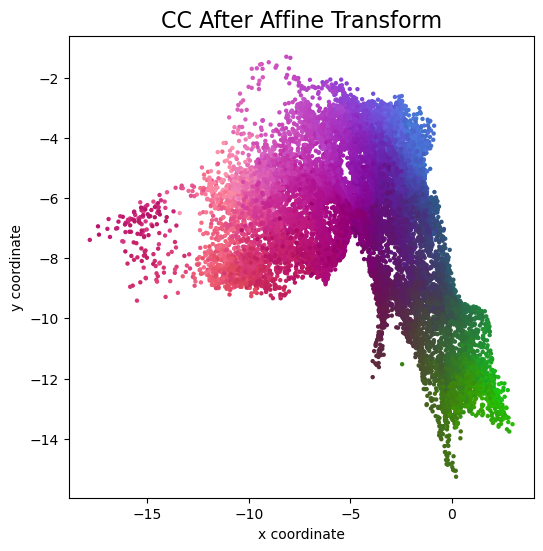

MAE: 0.7798
CEP: 0.7107
DRMS: 0.9795
Loss: 1.7568


2024-12-05 14:07:35.923779: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 14:07:36.764865: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 14:07:38.174762: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 14:07:38.231094: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 14:08:49.259360: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


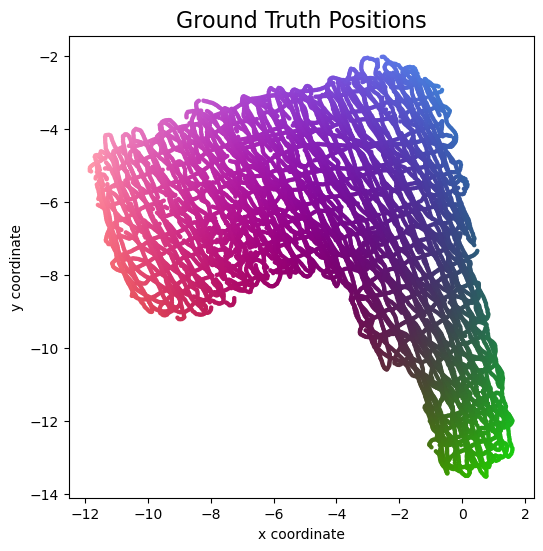

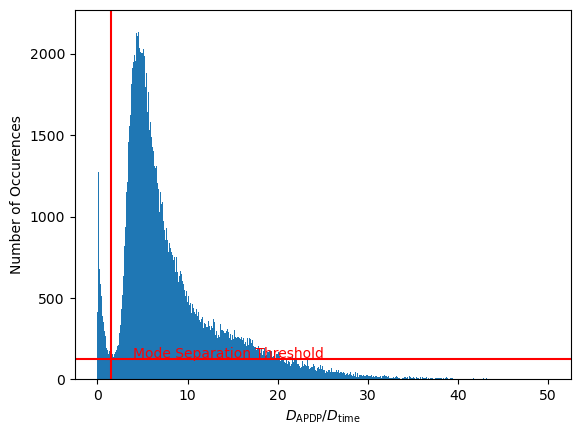

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733407872.340893  980430 service.cc:145] XLA service 0x7b5c041b9f70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733407872.340945  980430 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 14:11:12.475007: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 14:11:12.821765: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 14:11:13.639811: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  14/3000 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - loss: 43.4579

I0000 00:00:1733407874.985611  980430 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0019
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9863
TW: 0.9870
KS: 0.1544


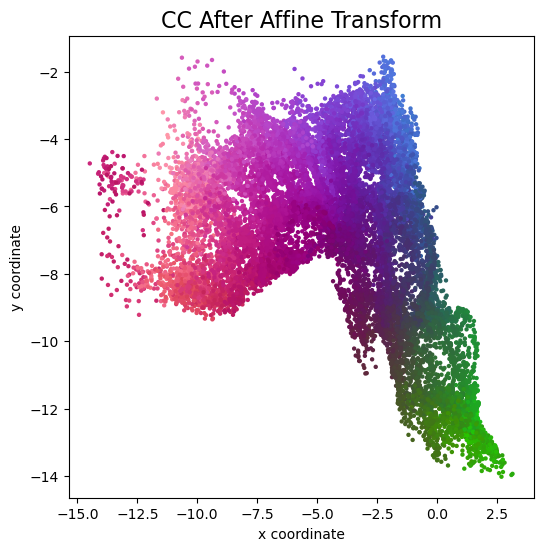

MAE: 0.6194
CEP: 0.5392
DRMS: 0.7896
Loss: 1.7760


2024-12-05 14:12:33.455600: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-05 14:12:34.384856: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-05 14:12:35.871131: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-05 14:12:35.925712: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-05 14:13:01.587080: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


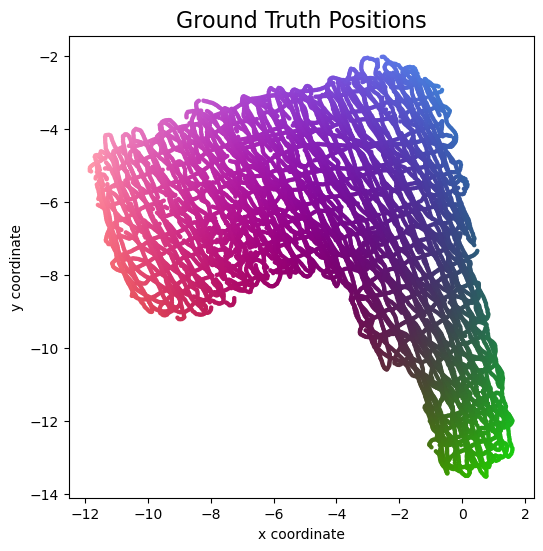

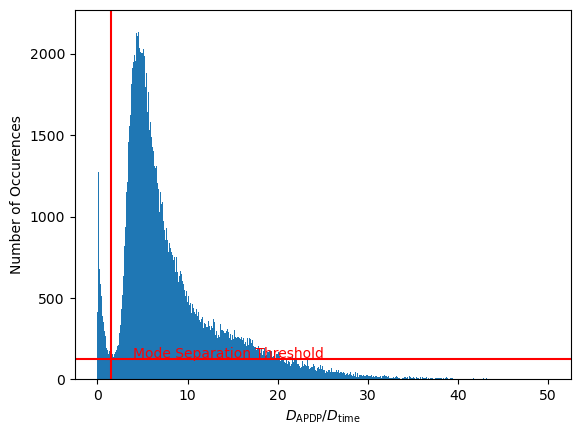

gamma =  1.5166666507720947


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 99 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733408125.652364  986858 service.cc:145] XLA service 0x7b5c400043f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733408125.652410  986858 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-05 14:15:25.761836: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-05 14:15:26.089086: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-05 14:15:26.835252: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

  15/3000 ━━━━━━━━━━━━━━━━━━━━ 36s 12ms/step - loss: 42.0585

I0000 00:00:1733408128.177336  986858 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 79s 24ms/step - loss: 3.0821
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9830
TW: 0.9855
KS: 0.1726


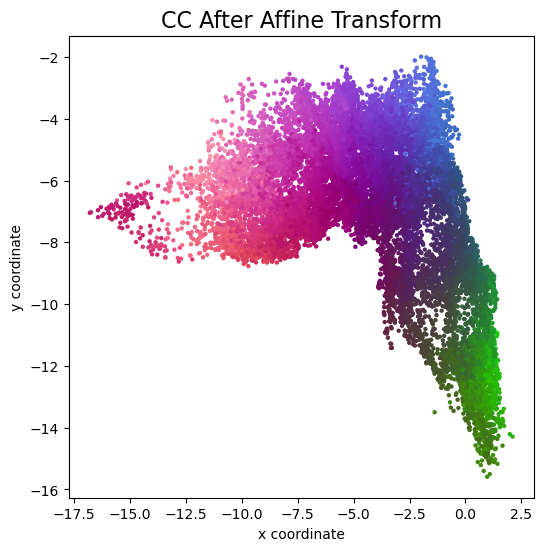

MAE: 0.7310
CEP: 0.6583
DRMS: 0.9396
Loss: 1.7929


In [5]:
for i in range(30):
    p = mp.Process(target=objective_process, args=(result_queue,))
    p.start()
    p.join()

    mae, cep, drms, loss = result_queue.get()
    maes.append(mae)
    ceps.append(cep)
    drmss.append(drms)
    losses.append(loss)

In [6]:
maes = np.asarray(maes)
ceps = np.asarray(ceps)
drmss = np.asarray(drmss)
losses = np.asarray(losses)

In [7]:
import matplotlib.pyplot as plt

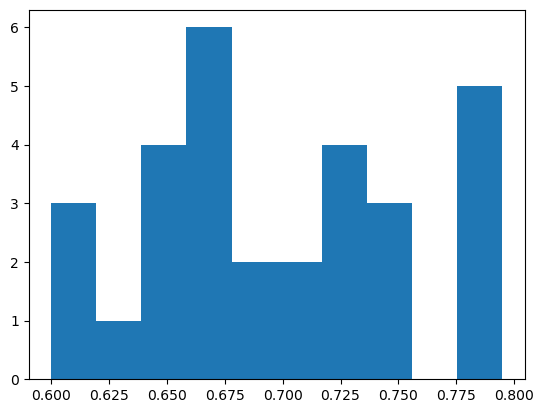

In [8]:
plt.hist(maes)
plt.show()

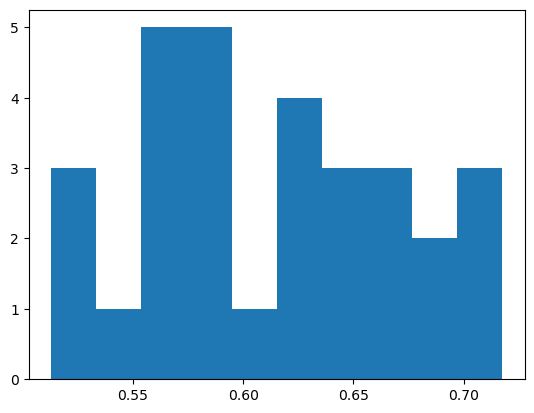

In [9]:
plt.hist(ceps)
plt.show()

In [10]:
print(f"Mean MAE: {np.mean(maes):.3f}")
print(f"Mean CEP: {np.mean(ceps):.3f}")

Mean MAE: 0.696
Mean CEP: 0.613


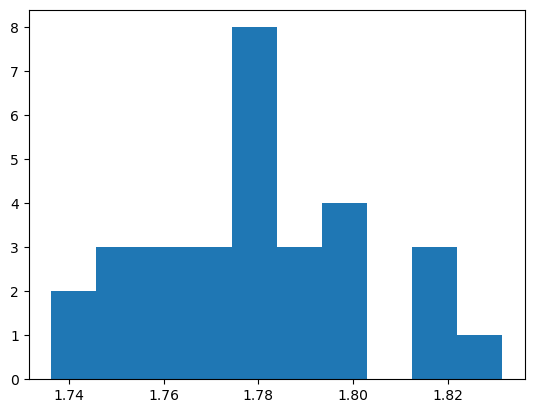

In [11]:
plt.hist(losses)
plt.show()

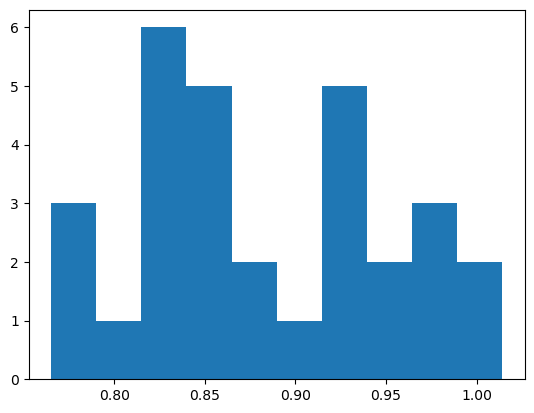

In [12]:
plt.hist(drmss)
plt.show()

In [13]:
print(f"Mean MAE : {np.mean(maes):.3f}")
print(f"Mean CEP : {np.mean(ceps):.3f}")
print(f"Mean DRMS: {np.mean(drmss):.3f}")

Mean MAE : 0.696
Mean CEP : 0.613
Mean DRMS: 0.883


In [14]:
loss_sort_order = np.argsort(losses)

In [15]:
print("Results for 20 training passes with lowest loss")
print(f"Mean MAE : {np.mean(maes[loss_sort_order][:20]):.3f}")
print(f"Mean CEP : {np.mean(ceps[loss_sort_order][:20]):.3f}")
print(f"Mean DRMS: {np.mean(drmss[loss_sort_order][:20]):.3f}")

Results for 20 training passes with lowest loss
Mean MAE : 0.682
Mean CEP : 0.599
Mean DRMS: 0.867
